#**Exam DS**

Let's solve our last task) This is a more complex task, so read the conditions carefully. Note that in addition to sales_train_evaluation.csv and sales_train_validation.csv there are a couple more tables, figure out now why they are necessary and how to use them.

Problem: https://www.kaggle.com/competitions/m5-forecasting-accuracy/overview

This competition uses a Weighted Root Mean Squared Scaled Error.

You can use sales_train_evaluation.csv as train data and sales_train_validation.csv as test data.

Steps:

1. Make an EDA.
2. You can use any methods)
3. Write an analysis of your problem: what methods did you use and why.
4. Why do you think the competition uses a Weighted Root Mean Squared Scaled Error?

In the challenge, you are predicting item sales at stores in various locations for two 28-day time periods. Information about the data is found in the M5 Participants Guide.

#I will analyze the available data. To understand what information was provided to us for analysis.

#**Files**

1. calendar.csv - Contains information about the dates on which the products are sold.

2. sales_train_validation.csv - Contains the historical daily unit sales data per product and store [d_1 - d_1913]

3. sample_submission.csv - The correct format for submissions.

4. sell_prices.csv - Contains information about the price of the products sold per store and date.

5. sales_train_evaluation.csv - Correct dataset with answers to the task.

https://www.kaggle.com/competitions/m5-forecasting-accuracy/data

##1.I will upload all the necessary data.I placed all the datasets on Google Drive, so that when connecting to Google Collab or another environment, it would be convenient to immediately work with the datasets.

In [1]:
!pip install gdown

In [46]:
import gdown
import pandas as pd
from io import StringIO


def load_csv_from_gdrive(file_id):
    url = f'https://drive.google.com/uc?export=download&id={file_id}'

    output = 'temp.csv'
    gdown.download(url, output, quiet=True)

    return pd.read_csv(output, sep=',')

file_ids = {
    'sell_prices': '1GFV8lP4HCDmAc-TwfS5fmXBQdHrm-aej',
    'sample_submission': '1JaeDf2Gm8t6jRMk5a_mXItVvEFer_8ln',
    'sales_train_validation': '1lGEiWlFc8PXW8oybRqsDnIttebzWG--2',
    'sales_train_evaluation': '1L-AGfMq5JKa_RyNWX89WsjerGqcH1Z6V',
    'calendar': '11O7so2mqyvAD4TOXK89XmqEQ0F_jOJBx'
}


dfs = {name: load_csv_from_gdrive(file_id) for name, file_id in file_ids.items()}


sell_prices_df = dfs['sell_prices']
sample_submission_df = dfs['sample_submission']
sales_train_validation_df = dfs['sales_train_validation']
sales_train_evaluation_df = dfs['sales_train_evaluation']
calendar_df = dfs['calendar']





#**Sell_prices_df: contains store and product IDs along with the average weekly sale price of the product.**

store_id - store identifier

item_id - product identifier

wm_yr_wk - week of the year

sell_price - average product price for the week

In [3]:
sell_prices_df

,store_id,item_id,wm_yr_wk,sell_price
0,CA_1,HOBBIES_1_001,11325,9.58
1,CA_1,HOBBIES_1_001,11326,9.58
2,CA_1,HOBBIES_1_001,11327,8.26
3,CA_1,HOBBIES_1_001,11328,8.26
4,CA_1,HOBBIES_1_001,11329,8.26
...,...,...,...,...
6841116,WI_3,FOODS_3_827,11617,1.00
6841117,WI_3,FOODS_3_827,11618,1.00
6841118,WI_3,FOODS_3_827,11619,1.00
6841119,WI_3,FOODS_3_827,11620,1.00


In [4]:
df_sorted = sell_prices_df.sort_values(by='wm_yr_wk')

In [5]:
df_sorted

,store_id,item_id,wm_yr_wk,sell_price
3886602,TX_2,FOODS_2_243,11101,5.98
6489238,WI_3,HOUSEHOLD_2_421,11101,4.67
6138163,WI_2,FOODS_3_799,11101,1.98
4717697,TX_3,FOODS_3_452,11101,4.72
1356987,CA_3,HOBBIES_1_092,11101,2.28
...,...,...,...,...
1967349,CA_3,FOODS_3_546,11621,5.98
1967067,CA_3,FOODS_3_545,11621,1.00
1966919,CA_3,FOODS_3_544,11621,2.98
1969033,CA_3,FOODS_3_554,11621,3.48


#**Our sample_submission_df**

In [6]:
sample_submission_df

,id,F1,F2,F3,F4,F5,F6,F7,F8,F9,...,F19,F20,F21,F22,F23,F24,F25,F26,F27,F28
0,HOBBIES_1_001_CA_1_validation,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,HOBBIES_1_002_CA_1_validation,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,HOBBIES_1_003_CA_1_validation,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,HOBBIES_1_004_CA_1_validation,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,HOBBIES_1_005_CA_1_validation,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
60975,FOODS_3_823_WI_3_evaluation,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
60976,FOODS_3_824_WI_3_evaluation,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
60977,FOODS_3_825_WI_3_evaluation,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
60978,FOODS_3_826_WI_3_evaluation,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


#**sales_train_validation_df**

Dataset analysis:
1. id: Identifier of a specific product, analyzing data about which you need to make a forecast for 8 weeks.
2. item_id: Product ID.
3. dept_id: ID of the category to which the item belongs (household goods, food or hobby goods).
4. cat_id: Identifier of the category to which the item belongs (household goods, food or hobby goods).
5. store_id: ID of the store where the product was sold.
6. Days. In total, the dataset contains information about 1913 days.

In [7]:
sales_train_validation_df

,id,item_id,dept_id,cat_id,store_id,state_id,d_1,d_2,d_3,d_4,...,d_1904,d_1905,d_1906,d_1907,d_1908,d_1909,d_1910,d_1911,d_1912,d_1913
0,HOBBIES_1_001_CA_1_validation,HOBBIES_1_001,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,...,1,3,0,1,1,1,3,0,1,1
1,HOBBIES_1_002_CA_1_validation,HOBBIES_1_002,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
2,HOBBIES_1_003_CA_1_validation,HOBBIES_1_003,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,...,2,1,2,1,1,1,0,1,1,1
3,HOBBIES_1_004_CA_1_validation,HOBBIES_1_004,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,...,1,0,5,4,1,0,1,3,7,2
4,HOBBIES_1_005_CA_1_validation,HOBBIES_1_005,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,...,2,1,1,0,1,1,2,2,2,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
30485,FOODS_3_823_WI_3_validation,FOODS_3_823,FOODS_3,FOODS,WI_3,WI,0,0,2,2,...,2,0,0,0,0,0,1,0,0,1
30486,FOODS_3_824_WI_3_validation,FOODS_3_824,FOODS_3,FOODS,WI_3,WI,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
30487,FOODS_3_825_WI_3_validation,FOODS_3_825,FOODS_3,FOODS,WI_3,WI,0,6,0,2,...,2,1,0,2,0,1,0,0,1,0
30488,FOODS_3_826_WI_3_validation,FOODS_3_826,FOODS_3,FOODS,WI_3,WI,0,0,0,0,...,0,0,1,0,0,1,0,3,1,3


#**sales_train_evaluation_df: sales_train_validation_df supplemented with information on product sales for 28 days.**

In [8]:
sales_train_evaluation_df

,id,item_id,dept_id,cat_id,store_id,state_id,d_1,d_2,d_3,d_4,...,d_1932,d_1933,d_1934,d_1935,d_1936,d_1937,d_1938,d_1939,d_1940,d_1941
0,HOBBIES_1_001_CA_1_evaluation,HOBBIES_1_001,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,...,2,4,0,0,0,0,3,3,0,1
1,HOBBIES_1_002_CA_1_evaluation,HOBBIES_1_002,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,...,0,1,2,1,1,0,0,0,0,0
2,HOBBIES_1_003_CA_1_evaluation,HOBBIES_1_003,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,...,1,0,2,0,0,0,2,3,0,1
3,HOBBIES_1_004_CA_1_evaluation,HOBBIES_1_004,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,...,1,1,0,4,0,1,3,0,2,6
4,HOBBIES_1_005_CA_1_evaluation,HOBBIES_1_005,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,...,0,0,0,2,1,0,0,2,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
30485,FOODS_3_823_WI_3_evaluation,FOODS_3_823,FOODS_3,FOODS,WI_3,WI,0,0,2,2,...,1,0,3,0,1,1,0,0,1,1
30486,FOODS_3_824_WI_3_evaluation,FOODS_3_824,FOODS_3,FOODS,WI_3,WI,0,0,0,0,...,0,0,0,0,0,0,1,0,1,0
30487,FOODS_3_825_WI_3_evaluation,FOODS_3_825,FOODS_3,FOODS,WI_3,WI,0,6,0,2,...,0,0,1,2,0,1,0,1,0,2
30488,FOODS_3_826_WI_3_evaluation,FOODS_3_826,FOODS_3,FOODS,WI_3,WI,0,0,0,0,...,1,1,1,4,6,0,1,1,1,0


#**calendar_df: contains a detailed description of dates, and this dataset also contains information about important events and SNAPs.**

date: Date in “y-m-d” format.

wm_yr_wk: Number of the week in which the date falls.

weekday: Type of day of the week (Saturday, Sunday, …, Friday).

wday: Number of the day of the week, starting with Saturday.

month: Number of the month in which the date will fall.

year: The year in which the date falls.

event_name_1: If some significant event occurred on the date, then this
contains the name of this event, otherwise NaN.

event_type_1: If some significant event occurred on a date, then the type of this event is contained here, otherwise NaN.

event_name_2: If there is another significant event on the date, then this contains the name of the second event, otherwise NaN.

event_type_2: If there is another significant event on the date, then the type of the second event is contained here, otherwise NaN.

snap_CA, snap_TX, and snap_WI: A binary value (0 or 1) that indicates whether a particular state paid out benefits to 1/10 of the population or not. 1 shows that payments have been made. (in total, exactly 10 units are observed within 1 month, see below).

P.S.:SNAP - Supplemental Nutrition Assistance Program / Supplemental Nutrition Assistance Program. The US government will provide low-income families with a plastic card, in many states cash benefits for which are distributed among people for 10 days of the month, and on each of these days 1/10 of the population receives benefits on their card. Basically, the card can be used to pay for healthy food products such as fruits, meat, milk, etc. The card does not apply to goods such as alcohol, cigarettes, animal feed, fast food, etc. including household accessories and hobby goods too

In [9]:
calendar_df

,date,wm_yr_wk,weekday,wday,month,year,d,event_name_1,event_type_1,event_name_2,event_type_2,snap_CA,snap_TX,snap_WI
0,2011-01-29,11101,Saturday,1,1,2011,d_1,NaN,NaN,NaN,NaN,0,0,0
1,2011-01-30,11101,Sunday,2,1,2011,d_2,NaN,NaN,NaN,NaN,0,0,0
2,2011-01-31,11101,Monday,3,1,2011,d_3,NaN,NaN,NaN,NaN,0,0,0
3,2011-02-01,11101,Tuesday,4,2,2011,d_4,NaN,NaN,NaN,NaN,1,1,0
4,2011-02-02,11101,Wednesday,5,2,2011,d_5,NaN,NaN,NaN,NaN,1,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1964,2016-06-15,11620,Wednesday,5,6,2016,d_1965,NaN,NaN,NaN,NaN,0,1,1
1965,2016-06-16,11620,Thursday,6,6,2016,d_1966,NaN,NaN,NaN,NaN,0,0,0
1966,2016-06-17,11620,Friday,7,6,2016,d_1967,NaN,NaN,NaN,NaN,0,0,0
1967,2016-06-18,11621,Saturday,1,6,2016,d_1968,NaN,NaN,NaN,NaN,0,0,0


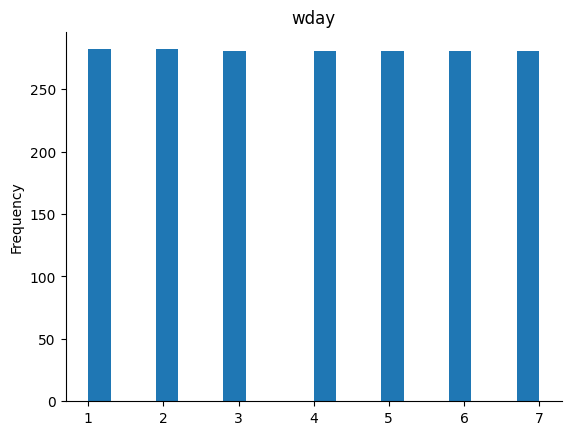

In [10]:
# @title wday

from matplotlib import pyplot as plt
calendar_df['wday'].plot(kind='hist', bins=20, title='wday')
plt.gca().spines[['top', 'right',]].set_visible(False)

#**2. We have provided quite a lot of different information in different datasets. Therefore, I will create new datasets based on the presented ones, for convenient work with data.**

#1. I will create a dataset where information about the total number of purchases for each of 3 categories by day will be stored

In [11]:
from datetime import datetime,timedelta,date


categor_df = sales_train_validation_df.drop(['id','item_id','dept_id','store_id','state_id'], axis=1)
categor_df = categor_df.groupby('cat_id').sum().T
categor_df['Date']= [date(2011,1,29) + timedelta(delta) for delta in range(1913)]



In [12]:
categor_df

cat_id,FOODS,HOBBIES,HOUSEHOLD,Date
d_1,23178,3764,5689,2011-01-29
d_2,22758,3357,5634,2011-01-30
d_3,17174,2682,3927,2011-01-31
d_4,18878,2669,3865,2011-02-01
d_5,14603,1814,2729,2011-02-02
...,...,...,...,...
d_1909,23632,3472,8239,2016-04-20
d_1910,23317,3353,8363,2016-04-21
d_1911,26704,4085,9728,2016-04-22
d_1912,31927,4787,12248,2016-04-23


#Based on this dataset, I will make time series graphs for detailed data analysis. On the x-axis I will make labels for the months of each year, for convenience, because if you indicate every day as labels, the graph will be very cluttered.

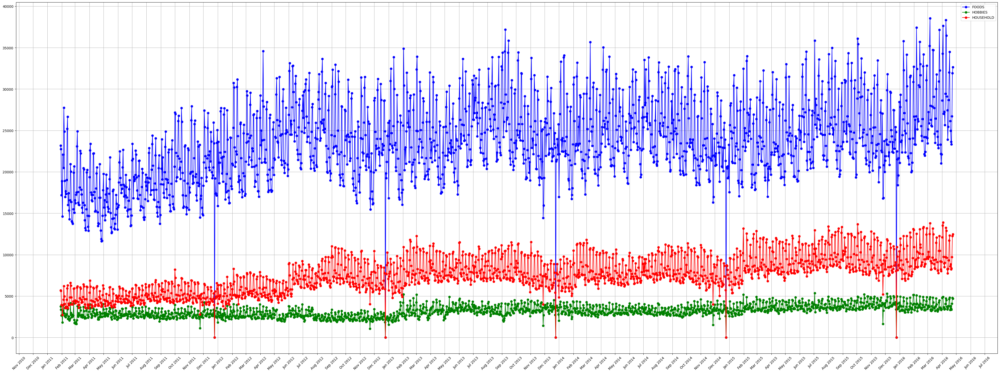

In [13]:
import matplotlib.pyplot as plt
import matplotlib.dates as mdates

categor_df['Date'] = pd.to_datetime(categor_df['Date'])


plt.figure(figsize=(40, 15))
plt.plot(categor_df['Date'], categor_df['FOODS'], marker='o', linestyle='-', color='blue', label='FOODS')
plt.plot(categor_df['Date'], categor_df['HOBBIES'], marker='o', linestyle='-', color='green', label='HOBBIES')
plt.plot(categor_df['Date'], categor_df['HOUSEHOLD'], marker='o', linestyle='-', color='red', label='HOUSEHOLD')



#I will format the date so that only the month and year are displayed, so as not to clutter the chart
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%b %Y'))
plt.gca().xaxis.set_major_locator(mdates.MonthLocator())


plt.xticks(rotation=45)

plt.grid(True)
plt.legend()

plt.tight_layout()
plt.show()


#If I also take a look at these graphs and the graphs below, we can say with confidence that this data has no seasonality.

#**1.** From this graph we can immediately conclude that the demand for FOOD is greatest, then comes HOUSEHOLD, and after that HOBBIES.Moreover, FOODS is bought, judging by the graph, on average 4 times more often than HOUSEHOLD

#**Top:**
#1. FOODS
#2. HOUSEHOLD
#3. HOBBIES



#**2.** Having studied the graph, you can see that at the end of each year presented (the end of December) there is an abnormal decline in purchases for all 3 categories of goods.

#**3.** It is also clear that FOODS and HOUSEHOLD have a slow upward trend, while HOBBIES have a stable trend throughout the entire time

#2. Now I want to determine the popularity of stores. And I will create a dataset that will store information about the total purchase of goods for each day in each store.

In [14]:
store_df = sales_train_validation_df.drop(['id','item_id','cat_id','dept_id','state_id'], axis=1)
store_df = store_df.groupby('store_id').sum().T
store_df['Date'] = [date(2011,1,29) + timedelta(delta) for delta in range(1913)]


In [15]:
store_df

store_id,CA_1,CA_2,CA_3,CA_4,TX_1,TX_2,TX_3,WI_1,WI_2,WI_3,Date
d_1,4337,3494,4739,1625,2556,3852,3030,2704,2256,4038,2011-01-29
d_2,4155,3046,4827,1777,2687,3937,3006,2194,1922,4198,2011-01-30
d_3,2816,2121,3785,1386,1822,2731,2225,1562,2018,3317,2011-01-31
d_4,3051,2324,4232,1440,2258,2954,2169,1251,2522,3211,2011-02-01
d_5,2630,1942,3817,1536,1694,2492,1726,2,1175,2132,2011-02-02
...,...,...,...,...,...,...,...,...,...,...,...
d_1909,3722,3691,5235,2500,2901,3384,3315,3242,4194,3159,2016-04-20
d_1910,3709,3303,5018,2458,2776,3446,3380,3324,4393,3226,2016-04-21
d_1911,4387,4457,5623,2628,3022,3902,3691,3991,4988,3828,2016-04-22
d_1912,5577,5884,7419,2954,3700,4483,4083,4772,5404,4686,2016-04-23


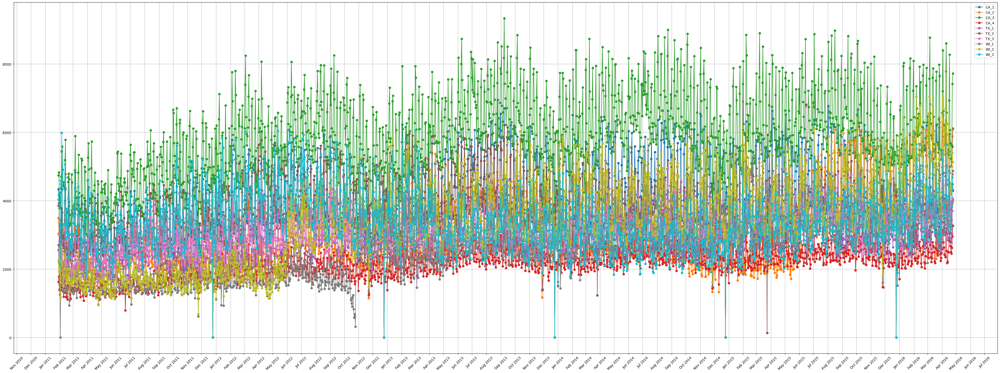

In [16]:
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import pandas as pd


store_df['Date'] = pd.to_datetime(store_df['Date'])

plt.figure(figsize=(40, 15))


plt.plot(store_df['Date'], store_df['CA_1'], marker='o', linestyle='-', label='CA_1')
plt.plot(store_df['Date'], store_df['CA_2'], marker='o', linestyle='-', label='CA_2')
plt.plot(store_df['Date'], store_df['CA_3'], marker='o', linestyle='-', label='CA_3')
plt.plot(store_df['Date'], store_df['CA_4'], marker='o', linestyle='-', label='CA_4')

plt.plot(store_df['Date'], store_df['TX_1'], marker='o', linestyle='-', label='TX_1')
plt.plot(store_df['Date'], store_df['TX_2'], marker='o', linestyle='-', label='TX_2')
plt.plot(store_df['Date'], store_df['TX_3'], marker='o', linestyle='-', label='TX_3')

plt.plot(store_df['Date'], store_df['WI_1'], marker='o', linestyle='-', label='WI_1')
plt.plot(store_df['Date'], store_df['WI_2'], marker='o', linestyle='-', label='WI_2')
plt.plot(store_df['Date'], store_df['WI_3'], marker='o', linestyle='-', label='WI_3')

plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%b %Y'))
plt.gca().xaxis.set_major_locator(mdates.MonthLocator())

plt.xticks(rotation=45)

plt.grid(True)
plt.legend()

plt.tight_layout()
plt.show()


#To draw conclusions from the graph, I will divide it into 3 separate graphs.Because The number of purchases is also influenced by the population of the states, and it is different for each state. Accordingly, it is incorrect to analyze purchases in all stores together.Therefore, it is important to make separate tops for the polarity of stores in each state.

##1. I will analyze the popularity of California stores

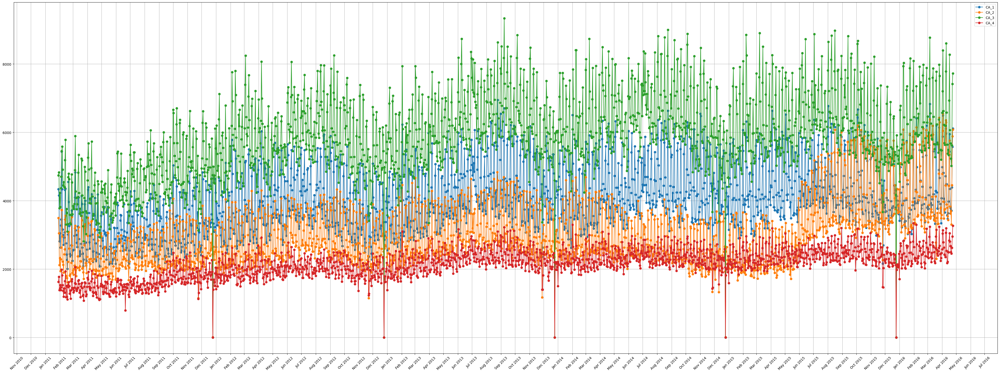

In [17]:
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import pandas as pd


store_df['Date'] = pd.to_datetime(store_df['Date'])

plt.figure(figsize=(40, 15))


plt.plot(store_df['Date'], store_df['CA_1'], marker='o', linestyle='-', label='CA_1')
plt.plot(store_df['Date'], store_df['CA_2'], marker='o', linestyle='-', label='CA_2')
plt.plot(store_df['Date'], store_df['CA_3'], marker='o', linestyle='-', label='CA_3')
plt.plot(store_df['Date'], store_df['CA_4'], marker='o', linestyle='-', label='CA_4')


plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%b %Y'))
plt.gca().xaxis.set_major_locator(mdates.MonthLocator())

plt.xticks(rotation=45)

plt.grid(True)
plt.legend()

plt.tight_layout()
plt.show()


Looking at the graph, I will build a rating of stores:
1. CA_3
2. CA_1
3. CA_2
4. CA_4

##2. I will analyze the popularity of Texas stores

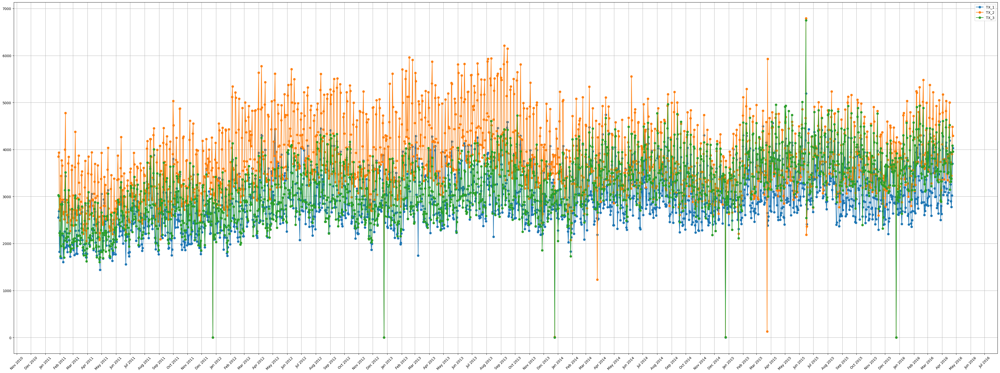

In [18]:
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import pandas as pd


store_df['Date'] = pd.to_datetime(store_df['Date'])

plt.figure(figsize=(40, 15))



plt.plot(store_df['Date'], store_df['TX_1'], marker='o', linestyle='-', label='TX_1')
plt.plot(store_df['Date'], store_df['TX_2'], marker='o', linestyle='-', label='TX_2')
plt.plot(store_df['Date'], store_df['TX_3'], marker='o', linestyle='-', label='TX_3')



plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%b %Y'))
plt.gca().xaxis.set_major_locator(mdates.MonthLocator())

plt.xticks(rotation=45)

plt.grid(True)
plt.legend()

plt.tight_layout()
plt.show()


Looking at the graph, I will build a rating of stores:
1. TX_2
2. TX_3
3. TX_1


##3. I will analyze the popularity of Wisconsin stores

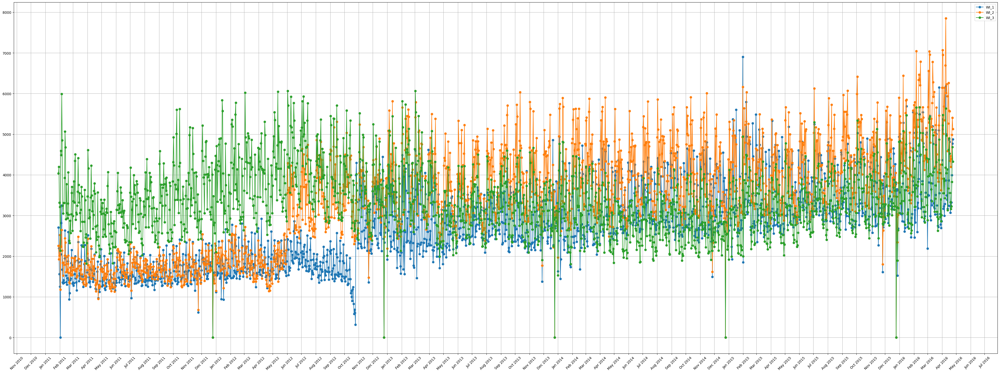

In [19]:
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import pandas as pd


store_df['Date'] = pd.to_datetime(store_df['Date'])

plt.figure(figsize=(40, 15))



plt.plot(store_df['Date'], store_df['WI_1'], marker='o', linestyle='-', label='WI_1')
plt.plot(store_df['Date'], store_df['WI_2'], marker='o', linestyle='-', label='WI_2')
plt.plot(store_df['Date'], store_df['WI_3'], marker='o', linestyle='-', label='WI_3')

plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%b %Y'))
plt.gca().xaxis.set_major_locator(mdates.MonthLocator())

plt.xticks(rotation=45)

plt.grid(True)
plt.legend()

plt.tight_layout()
plt.show()


#It’s difficult to create top stores using this chart, so I’ll build a diagram.

In [20]:
store_df

store_id,CA_1,CA_2,CA_3,CA_4,TX_1,TX_2,TX_3,WI_1,WI_2,WI_3,Date
d_1,4337,3494,4739,1625,2556,3852,3030,2704,2256,4038,2011-01-29
d_2,4155,3046,4827,1777,2687,3937,3006,2194,1922,4198,2011-01-30
d_3,2816,2121,3785,1386,1822,2731,2225,1562,2018,3317,2011-01-31
d_4,3051,2324,4232,1440,2258,2954,2169,1251,2522,3211,2011-02-01
d_5,2630,1942,3817,1536,1694,2492,1726,2,1175,2132,2011-02-02
...,...,...,...,...,...,...,...,...,...,...,...
d_1909,3722,3691,5235,2500,2901,3384,3315,3242,4194,3159,2016-04-20
d_1910,3709,3303,5018,2458,2776,3446,3380,3324,4393,3226,2016-04-21
d_1911,4387,4457,5623,2628,3022,3902,3691,3991,4988,3828,2016-04-22
d_1912,5577,5884,7419,2954,3700,4483,4083,4772,5404,4686,2016-04-23


In [21]:
summary_store = store_df.drop(columns=['Date']).sum().reset_index()
summary_store.columns = ['Column', 'Total_Sum']




In [22]:
summary_store

,Column,Total_Sum
0,CA_1,7698216
1,CA_2,5685475
2,CA_3,11188180
3,CA_4,4103676
4,TX_1,5595292
5,TX_2,7214384
6,TX_3,6089330
7,WI_1,5149062
8,WI_2,6544012
9,WI_3,6427782


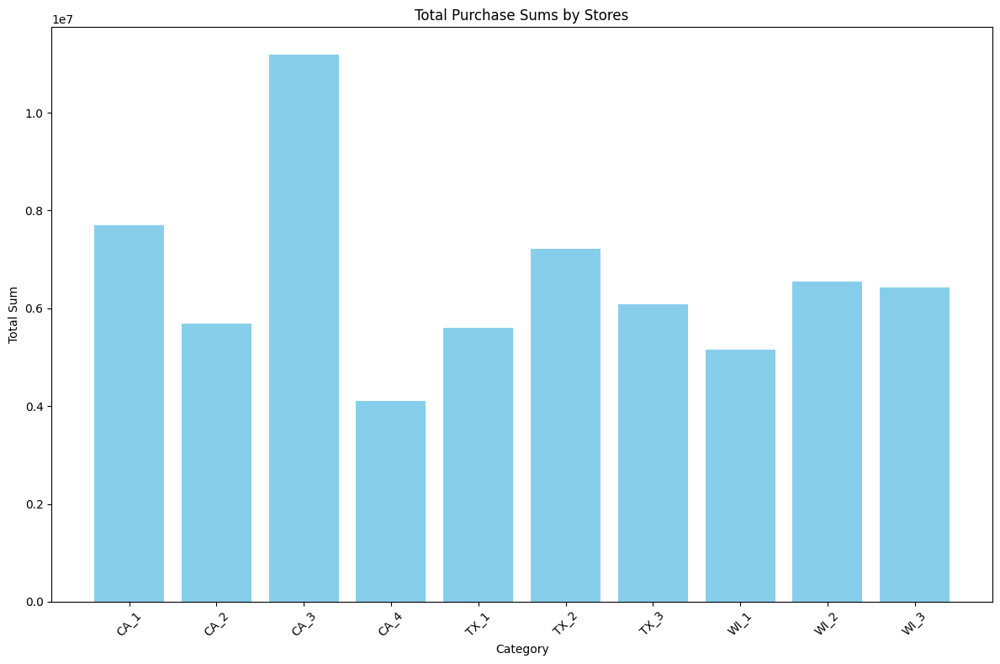

In [23]:
plt.figure(figsize=(12, 8))
plt.bar(summary_store['Column'], summary_store['Total_Sum'], color='skyblue')


plt.title('Total Purchase Sums by Stores')
plt.xlabel('Category')
plt.ylabel('Total Sum')
plt.xticks(rotation=45)

plt.tight_layout()
plt.show()

#From the chart you can determine the top stores in Wisconsin by popularity.

**Top:**
1. WI_2
2. WI_3
3. WI_1

#Now I want to find out in which state the total largest number of purchases is made.

In [24]:
popul_st_in_state= pd.DataFrame()


ca_sum = summary_store[summary_store['Column'].str.startswith('CA')]['Total_Sum'].sum()
tx_sum = summary_store[summary_store['Column'].str.startswith('TX')]['Total_Sum'].sum()
wi_sum = summary_store[summary_store['Column'].str.startswith('WI')]['Total_Sum'].sum()


popul_st_in_state = pd.DataFrame({
    'CA': [ca_sum],
    'TX': [tx_sum],
    'WI': [wi_sum],

})


In [25]:
popul_st_in_state

,CA,TX,WI
0,28675547,18899006,18120856


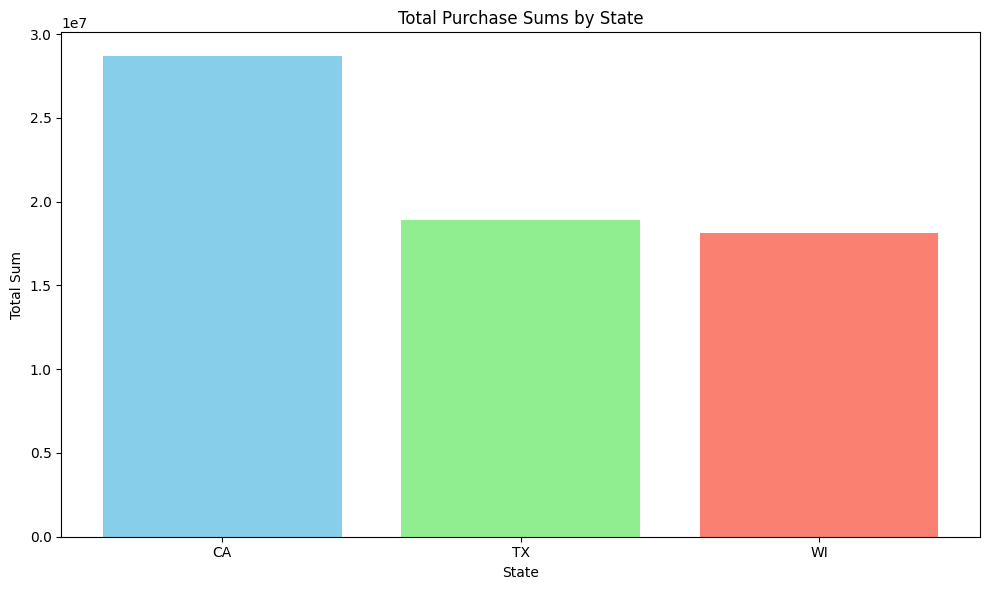

In [26]:
plt.figure(figsize=(10, 6))
plt.bar(popul_st_in_state.columns, popul_st_in_state.loc[0], color=['skyblue', 'lightgreen', 'salmon'])


plt.title('Total Purchase Sums by State')
plt.xlabel('State')
plt.ylabel('Total Sum')


plt.tight_layout()
plt.show()

Looking at the graph, I will build a ranking of states by shopping:

1. CA
2. TX
3. WI

#3. I will make a dataset with general information for each product and by day, as well as information about type of events and snaps

Because id in sales_train_validation_df already contains all the information, then I delete some columns to reduce the dataset. And because We know that the first date is 2011-01-29, I will provide information about the days in the year-month-day format for convenience.

In [27]:

from datetime import datetime, timedelta,date


df_main=sales_train_validation_df.drop(['item_id','dept_id','cat_id','store_id','state_id'], axis=1)


In [28]:

df_main

,id,d_1,d_2,d_3,d_4,d_5,d_6,d_7,d_8,d_9,...,d_1904,d_1905,d_1906,d_1907,d_1908,d_1909,d_1910,d_1911,d_1912,d_1913
0,HOBBIES_1_001_CA_1_validation,0,0,0,0,0,0,0,0,0,...,1,3,0,1,1,1,3,0,1,1
1,HOBBIES_1_002_CA_1_validation,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
2,HOBBIES_1_003_CA_1_validation,0,0,0,0,0,0,0,0,0,...,2,1,2,1,1,1,0,1,1,1
3,HOBBIES_1_004_CA_1_validation,0,0,0,0,0,0,0,0,0,...,1,0,5,4,1,0,1,3,7,2
4,HOBBIES_1_005_CA_1_validation,0,0,0,0,0,0,0,0,0,...,2,1,1,0,1,1,2,2,2,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
30485,FOODS_3_823_WI_3_validation,0,0,2,2,0,3,1,4,1,...,2,0,0,0,0,0,1,0,0,1
30486,FOODS_3_824_WI_3_validation,0,0,0,0,0,5,0,1,1,...,0,0,0,0,0,0,0,0,1,0
30487,FOODS_3_825_WI_3_validation,0,6,0,2,2,4,1,8,5,...,2,1,0,2,0,1,0,0,1,0
30488,FOODS_3_826_WI_3_validation,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,1,0,3,1,3


In [29]:

df_main = df_main.rename({'id': 'date'}, axis=1).set_index('date').T


In [30]:


df_main

date,HOBBIES_1_001_CA_1_validation,HOBBIES_1_002_CA_1_validation,HOBBIES_1_003_CA_1_validation,HOBBIES_1_004_CA_1_validation,HOBBIES_1_005_CA_1_validation,HOBBIES_1_006_CA_1_validation,HOBBIES_1_007_CA_1_validation,HOBBIES_1_008_CA_1_validation,HOBBIES_1_009_CA_1_validation,HOBBIES_1_010_CA_1_validation,...,FOODS_3_818_WI_3_validation,FOODS_3_819_WI_3_validation,FOODS_3_820_WI_3_validation,FOODS_3_821_WI_3_validation,FOODS_3_822_WI_3_validation,FOODS_3_823_WI_3_validation,FOODS_3_824_WI_3_validation,FOODS_3_825_WI_3_validation,FOODS_3_826_WI_3_validation,FOODS_3_827_WI_3_validation
d_1,0,0,0,0,0,0,0,12,2,0,...,0,14,1,0,4,0,0,0,0,0
d_2,0,0,0,0,0,0,0,15,0,0,...,0,11,1,0,4,0,0,6,0,0
d_3,0,0,0,0,0,0,0,0,7,1,...,0,5,1,0,2,2,0,0,0,0
d_4,0,0,0,0,0,0,0,0,3,0,...,0,6,1,0,5,2,0,2,0,0
d_5,0,0,0,0,0,0,0,0,0,0,...,0,5,1,0,2,0,0,2,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
d_1909,1,1,1,0,1,0,1,4,0,0,...,4,1,1,0,0,0,0,1,1,0
d_1910,3,0,0,1,2,0,0,6,0,0,...,2,3,3,0,2,1,0,0,0,0
d_1911,0,0,1,3,2,2,0,3,0,2,...,0,1,6,0,3,0,0,0,3,0
d_1912,1,0,1,7,2,0,1,2,0,0,...,3,0,0,4,2,0,1,1,1,0


In [31]:

df_main.index = [date(2011,1,29) + timedelta(delta) for delta in range(1913)]

In [32]:

df_main

date,HOBBIES_1_001_CA_1_validation,HOBBIES_1_002_CA_1_validation,HOBBIES_1_003_CA_1_validation,HOBBIES_1_004_CA_1_validation,HOBBIES_1_005_CA_1_validation,HOBBIES_1_006_CA_1_validation,HOBBIES_1_007_CA_1_validation,HOBBIES_1_008_CA_1_validation,HOBBIES_1_009_CA_1_validation,HOBBIES_1_010_CA_1_validation,...,FOODS_3_818_WI_3_validation,FOODS_3_819_WI_3_validation,FOODS_3_820_WI_3_validation,FOODS_3_821_WI_3_validation,FOODS_3_822_WI_3_validation,FOODS_3_823_WI_3_validation,FOODS_3_824_WI_3_validation,FOODS_3_825_WI_3_validation,FOODS_3_826_WI_3_validation,FOODS_3_827_WI_3_validation
2011-01-29,0,0,0,0,0,0,0,12,2,0,...,0,14,1,0,4,0,0,0,0,0
2011-01-30,0,0,0,0,0,0,0,15,0,0,...,0,11,1,0,4,0,0,6,0,0
2011-01-31,0,0,0,0,0,0,0,0,7,1,...,0,5,1,0,2,2,0,0,0,0
2011-02-01,0,0,0,0,0,0,0,0,3,0,...,0,6,1,0,5,2,0,2,0,0
2011-02-02,0,0,0,0,0,0,0,0,0,0,...,0,5,1,0,2,0,0,2,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2016-04-20,1,1,1,0,1,0,1,4,0,0,...,4,1,1,0,0,0,0,1,1,0
2016-04-21,3,0,0,1,2,0,0,6,0,0,...,2,3,3,0,2,1,0,0,0,0
2016-04-22,0,0,1,3,2,2,0,3,0,2,...,0,1,6,0,3,0,0,0,3,0
2016-04-23,1,0,1,7,2,0,1,2,0,0,...,3,0,0,4,2,0,1,1,1,0


Now I will give each product a unique number. and save all the information about which number is needed for which product in the dictionary


In [33]:

df_main.columns = list(map(lambda line: line[:-11], df_main.columns))
id_dict = {prev_name: "_" + str(new_name) for new_name, prev_name in enumerate(df_main.columns)}
name_id = dict(reversed(item) for item in id_dict.items())
df_main.columns = id_dict.values()

In [34]:
df_main

,_0,_1,_2,_3,_4,_5,_6,_7,_8,_9,...,_30480,_30481,_30482,_30483,_30484,_30485,_30486,_30487,_30488,_30489
2011-01-29,0,0,0,0,0,0,0,12,2,0,...,0,14,1,0,4,0,0,0,0,0
2011-01-30,0,0,0,0,0,0,0,15,0,0,...,0,11,1,0,4,0,0,6,0,0
2011-01-31,0,0,0,0,0,0,0,0,7,1,...,0,5,1,0,2,2,0,0,0,0
2011-02-01,0,0,0,0,0,0,0,0,3,0,...,0,6,1,0,5,2,0,2,0,0
2011-02-02,0,0,0,0,0,0,0,0,0,0,...,0,5,1,0,2,0,0,2,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2016-04-20,1,1,1,0,1,0,1,4,0,0,...,4,1,1,0,0,0,0,1,1,0
2016-04-21,3,0,0,1,2,0,0,6,0,0,...,2,3,3,0,2,1,0,0,0,0
2016-04-22,0,0,1,3,2,2,0,3,0,2,...,0,1,6,0,3,0,0,0,3,0
2016-04-23,1,0,1,7,2,0,1,2,0,0,...,3,0,0,4,2,0,1,1,1,0


I will add more information about events and snaps to this dataset

In [35]:
ind = df_main.reset_index()
cal = calendar_df.drop(['wm_yr_wk','weekday','wday',\
               'month','year','d','event_name_2','event_name_1'], axis=1)


In [36]:
cal

,date,event_type_1,event_type_2,snap_CA,snap_TX,snap_WI
0,2011-01-29,NaN,NaN,0,0,0
1,2011-01-30,NaN,NaN,0,0,0
2,2011-01-31,NaN,NaN,0,0,0
3,2011-02-01,NaN,NaN,1,1,0
4,2011-02-02,NaN,NaN,1,0,1
...,...,...,...,...,...,...
1964,2016-06-15,NaN,NaN,0,1,1
1965,2016-06-16,NaN,NaN,0,0,0
1966,2016-06-17,NaN,NaN,0,0,0
1967,2016-06-18,NaN,NaN,0,0,0


In [37]:

df_main = ind.join(cal, rsuffix='date').dropna(thresh=10).drop(['index'], axis=1).set_index('date')

In [38]:
df_main

,_0,_1,_2,_3,_4,_5,_6,_7,_8,_9,...,_30485,_30486,_30487,_30488,_30489,event_type_1,event_type_2,snap_CA,snap_TX,snap_WI
date,,,,,,,,,,,,,,,,,,,,,
2011-01-29,0,0,0,0,0,0,0,12,2,0,...,0,0,0,0,0,NaN,NaN,0,0,0
2011-01-30,0,0,0,0,0,0,0,15,0,0,...,0,0,6,0,0,NaN,NaN,0,0,0
2011-01-31,0,0,0,0,0,0,0,0,7,1,...,2,0,0,0,0,NaN,NaN,0,0,0
2011-02-01,0,0,0,0,0,0,0,0,3,0,...,2,0,2,0,0,NaN,NaN,1,1,0
2011-02-02,0,0,0,0,0,0,0,0,0,0,...,0,0,2,0,0,NaN,NaN,1,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2016-04-20,1,1,1,0,1,0,1,4,0,0,...,0,0,1,1,0,NaN,NaN,0,0,0
2016-04-21,3,0,0,1,2,0,0,6,0,0,...,1,0,0,0,0,NaN,NaN,0,0,0
2016-04-22,0,0,1,3,2,2,0,3,0,2,...,0,0,0,3,0,NaN,NaN,0,0,0


#4. I will create a dataset that will store information about the average price of a product and the average number of its sales for the entire time in all stores in all states

In [39]:
sell_prices_df

,store_id,item_id,wm_yr_wk,sell_price
0,CA_1,HOBBIES_1_001,11325,9.58
1,CA_1,HOBBIES_1_001,11326,9.58
2,CA_1,HOBBIES_1_001,11327,8.26
3,CA_1,HOBBIES_1_001,11328,8.26
4,CA_1,HOBBIES_1_001,11329,8.26
...,...,...,...,...
6841116,WI_3,FOODS_3_827,11617,1.00
6841117,WI_3,FOODS_3_827,11618,1.00
6841118,WI_3,FOODS_3_827,11619,1.00
6841119,WI_3,FOODS_3_827,11620,1.00


In [40]:
print(sell_prices_df.dtypes)


store_id       object
item_id        object
wm_yr_wk        int64
sell_price    float64
dtype: object


In [41]:
print(sell_prices_df['sell_price'].isnull().sum())

0


In [42]:

sell_prices_df_new=sell_prices_df.drop(['store_id','wm_yr_wk'], axis=1)


In [43]:
sell_prices_df_new = sell_prices_df_new.groupby('item_id').mean().loc[:, ['sell_price']]


In [44]:
sell_prices_df_new

,sell_price
item_id,
FOODS_1_001,2.166623
FOODS_1_002,8.933913
FOODS_1_003,2.975184
FOODS_1_004,1.848631
FOODS_1_005,3.329372
...,...
HOUSEHOLD_2_512,3.969964
HOUSEHOLD_2_513,2.780000
HOUSEHOLD_2_514,18.797089


#Hooray! Now we have average prices for each product over all time in all stores

In [45]:
from tqdm import tqdm

means = []
for item in tqdm(sell_prices_df_new.index):
  cur_keys = [key for key in id_dict.keys() if item in key]
  means.append(df_main.loc[:,[id_dict[key] for key in cur_keys]].mean().mean())
sell_prices_df_new.loc[:,'mean_sales'] = means


100%|██████████| 3049/3049 [00:14<00:00, 217.16it/s]


In [46]:
sell_prices_df_new

,sell_price,mean_sales
item_id,,
FOODS_1_001,2.166623,0.640199
FOODS_1_002,8.933913,0.383377
FOODS_1_003,2.975184,0.700157
FOODS_1_004,1.848631,6.768479
FOODS_1_005,3.329372,1.197804
...,...,...
HOUSEHOLD_2_512,3.969964,0.604025
HOUSEHOLD_2_513,2.780000,0.413800
HOUSEHOLD_2_514,18.797089,0.164663


#5. I will create a dataset with statistics for all products

In [47]:
stat_df = sell_prices_df.drop(['store_id','wm_yr_wk'], axis=1).groupby('item_id').describe()


In [48]:
stat_df

sell_price                                               \
                     count       mean           std   min    25%    50%   
item_id                                                                   
FOODS_1_001         2819.0   2.166623  1.162253e-01  0.99   2.00   2.24   
FOODS_1_002         2819.0   8.933913  4.856839e-01  7.66   8.88   8.88   
FOODS_1_003         2820.0   2.975184  1.560816e-01  2.50   2.88   2.88   
FOODS_1_004         2250.0   1.848631  1.066270e-01  1.50   1.78   1.78   
FOODS_1_005         2817.0   3.329372  1.962105e-01  0.10   3.28   3.28   
...                    ...        ...           ...   ...    ...    ...   
HOUSEHOLD_2_512     2814.0   3.969964  2.699552e-02  2.67   3.97   3.97   
HOUSEHOLD_2_513     1683.0   2.780000  1.332664e-15  2.78   2.78   2.78   
HOUSEHOLD_2_514     2817.0  18.797089  9.165032e-01  1.00  17.94  18.97   
HOUSEHOLD_2_515     1285.0   1.969230  2.761745e-02  0.98   1.97   1.97   
HOUSEHOLD_2_516     2810.0   5.936480  1.149416e-01  0.99   5.94   5.94   

                               
                   75%    max  
item_id                        
FOODS_1_001       2.24   2.24  
FOODS_1_002       9.48   9.48  
FOODS_1_003       3.23   3.23  
FOODS_1_004       1.96   1.96  
FOODS_1_005       3.54   3.54  
...                ...    ...  
HOUSEHOLD_2_512   3.97   4.27  
HOUSEHOLD_2_513   2.78   2.78  
HOUSEHOLD_2_514  18.97  20.97  
HOUSEHOLD_2_515   1.97   1.97  
HOUSEHOLD_2_516   5.94   5.94  

[3049 rows x 8 columns]

#**I also want to analyze how the average number of purchases for 3 types (HOBBIES, FOODS, HOUSEHOLD) depends on the State**

In [49]:
sales_train_validation_df

,id,item_id,dept_id,cat_id,store_id,state_id,d_1,d_2,d_3,d_4,...,d_1904,d_1905,d_1906,d_1907,d_1908,d_1909,d_1910,d_1911,d_1912,d_1913
0,HOBBIES_1_001_CA_1_validation,HOBBIES_1_001,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,...,1,3,0,1,1,1,3,0,1,1
1,HOBBIES_1_002_CA_1_validation,HOBBIES_1_002,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
2,HOBBIES_1_003_CA_1_validation,HOBBIES_1_003,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,...,2,1,2,1,1,1,0,1,1,1
3,HOBBIES_1_004_CA_1_validation,HOBBIES_1_004,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,...,1,0,5,4,1,0,1,3,7,2
4,HOBBIES_1_005_CA_1_validation,HOBBIES_1_005,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,...,2,1,1,0,1,1,2,2,2,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
30485,FOODS_3_823_WI_3_validation,FOODS_3_823,FOODS_3,FOODS,WI_3,WI,0,0,2,2,...,2,0,0,0,0,0,1,0,0,1
30486,FOODS_3_824_WI_3_validation,FOODS_3_824,FOODS_3,FOODS,WI_3,WI,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
30487,FOODS_3_825_WI_3_validation,FOODS_3_825,FOODS_3,FOODS,WI_3,WI,0,6,0,2,...,2,1,0,2,0,1,0,0,1,0
30488,FOODS_3_826_WI_3_validation,FOODS_3_826,FOODS_3,FOODS,WI_3,WI,0,0,0,0,...,0,0,1,0,0,1,0,3,1,3


In [50]:
sales_train_validation_df_new=sales_train_validation_df.drop(['id','item_id','dept_id','store_id'], axis=1)

In [51]:
sales_train_validation_df_new.groupby(['state_id','cat_id']).sum().T.agg(['mean', 'std']).T

mean          std
state_id cat_id                              
CA       FOODS      10034.658651  2128.135128
         HOBBIES     1589.065865   361.813686
         HOUSEHOLD   3366.106639   997.791471
TX       FOODS       6772.828542  1337.459426
         HOBBIES      832.377940   205.455413
         HOUSEHOLD   2274.043910   660.984530
WI       FOODS       6762.789336  1909.299499
         HOBBIES      780.228960   200.639253
         HOUSEHOLD   1929.462624   626.836167

##We see that in California "HOBBIES" products are purchased almost 2 times more often than in NX and WI. And “FOODS” is one and a half times more often.

#**RESULT:**
#**Now I have the following datasets:**
##1. df_main: a dataset that stores the number of sales for each product over the last 1913 days, as well as information about snaps and events
##2. summary_store: Dataset containing information about the total number of purchases in each store
##3. sell_prices_df_new: a dataset with information about each product in the form: cf. price, avg. number of sales.
##4. stat_df: Statistics of all 3049 product types.
##5. store_df: information on the total number of purchases in each store for each day.
##6. categor_df:Contains information about total purchases grouped by product category.

In [52]:
df_main

,_0,_1,_2,_3,_4,_5,_6,_7,_8,_9,...,_30485,_30486,_30487,_30488,_30489,event_type_1,event_type_2,snap_CA,snap_TX,snap_WI
date,,,,,,,,,,,,,,,,,,,,,
2011-01-29,0,0,0,0,0,0,0,12,2,0,...,0,0,0,0,0,NaN,NaN,0,0,0
2011-01-30,0,0,0,0,0,0,0,15,0,0,...,0,0,6,0,0,NaN,NaN,0,0,0
2011-01-31,0,0,0,0,0,0,0,0,7,1,...,2,0,0,0,0,NaN,NaN,0,0,0
2011-02-01,0,0,0,0,0,0,0,0,3,0,...,2,0,2,0,0,NaN,NaN,1,1,0
2011-02-02,0,0,0,0,0,0,0,0,0,0,...,0,0,2,0,0,NaN,NaN,1,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2016-04-20,1,1,1,0,1,0,1,4,0,0,...,0,0,1,1,0,NaN,NaN,0,0,0
2016-04-21,3,0,0,1,2,0,0,6,0,0,...,1,0,0,0,0,NaN,NaN,0,0,0
2016-04-22,0,0,1,3,2,2,0,3,0,2,...,0,0,0,3,0,NaN,NaN,0,0,0


In [53]:
summary_store

,Column,Total_Sum
0,CA_1,7698216
1,CA_2,5685475
2,CA_3,11188180
3,CA_4,4103676
4,TX_1,5595292
5,TX_2,7214384
6,TX_3,6089330
7,WI_1,5149062
8,WI_2,6544012
9,WI_3,6427782


In [54]:
sell_prices_df_new

,sell_price,mean_sales
item_id,,
FOODS_1_001,2.166623,0.640199
FOODS_1_002,8.933913,0.383377
FOODS_1_003,2.975184,0.700157
FOODS_1_004,1.848631,6.768479
FOODS_1_005,3.329372,1.197804
...,...,...
HOUSEHOLD_2_512,3.969964,0.604025
HOUSEHOLD_2_513,2.780000,0.413800
HOUSEHOLD_2_514,18.797089,0.164663


In [55]:
stat_df

sell_price                                               \
                     count       mean           std   min    25%    50%   
item_id                                                                   
FOODS_1_001         2819.0   2.166623  1.162253e-01  0.99   2.00   2.24   
FOODS_1_002         2819.0   8.933913  4.856839e-01  7.66   8.88   8.88   
FOODS_1_003         2820.0   2.975184  1.560816e-01  2.50   2.88   2.88   
FOODS_1_004         2250.0   1.848631  1.066270e-01  1.50   1.78   1.78   
FOODS_1_005         2817.0   3.329372  1.962105e-01  0.10   3.28   3.28   
...                    ...        ...           ...   ...    ...    ...   
HOUSEHOLD_2_512     2814.0   3.969964  2.699552e-02  2.67   3.97   3.97   
HOUSEHOLD_2_513     1683.0   2.780000  1.332664e-15  2.78   2.78   2.78   
HOUSEHOLD_2_514     2817.0  18.797089  9.165032e-01  1.00  17.94  18.97   
HOUSEHOLD_2_515     1285.0   1.969230  2.761745e-02  0.98   1.97   1.97   
HOUSEHOLD_2_516     2810.0   5.936480  1.149416e-01  0.99   5.94   5.94   

                               
                   75%    max  
item_id                        
FOODS_1_001       2.24   2.24  
FOODS_1_002       9.48   9.48  
FOODS_1_003       3.23   3.23  
FOODS_1_004       1.96   1.96  
FOODS_1_005       3.54   3.54  
...                ...    ...  
HOUSEHOLD_2_512   3.97   4.27  
HOUSEHOLD_2_513   2.78   2.78  
HOUSEHOLD_2_514  18.97  20.97  
HOUSEHOLD_2_515   1.97   1.97  
HOUSEHOLD_2_516   5.94   5.94  

[3049 rows x 8 columns]

In [56]:
store_df

store_id,CA_1,CA_2,CA_3,CA_4,TX_1,TX_2,TX_3,WI_1,WI_2,WI_3,Date
d_1,4337,3494,4739,1625,2556,3852,3030,2704,2256,4038,2011-01-29
d_2,4155,3046,4827,1777,2687,3937,3006,2194,1922,4198,2011-01-30
d_3,2816,2121,3785,1386,1822,2731,2225,1562,2018,3317,2011-01-31
d_4,3051,2324,4232,1440,2258,2954,2169,1251,2522,3211,2011-02-01
d_5,2630,1942,3817,1536,1694,2492,1726,2,1175,2132,2011-02-02
...,...,...,...,...,...,...,...,...,...,...,...
d_1909,3722,3691,5235,2500,2901,3384,3315,3242,4194,3159,2016-04-20
d_1910,3709,3303,5018,2458,2776,3446,3380,3324,4393,3226,2016-04-21
d_1911,4387,4457,5623,2628,3022,3902,3691,3991,4988,3828,2016-04-22
d_1912,5577,5884,7419,2954,3700,4483,4083,4772,5404,4686,2016-04-23


In [57]:
categor_df

cat_id,FOODS,HOBBIES,HOUSEHOLD,Date
d_1,23178,3764,5689,2011-01-29
d_2,22758,3357,5634,2011-01-30
d_3,17174,2682,3927,2011-01-31
d_4,18878,2669,3865,2011-02-01
d_5,14603,1814,2729,2011-02-02
...,...,...,...,...
d_1909,23632,3472,8239,2016-04-20
d_1910,23317,3353,8363,2016-04-21
d_1911,26704,4085,9728,2016-04-22
d_1912,31927,4787,12248,2016-04-23


#**I'll build the first baseline**

In [58]:
df_main

,_0,_1,_2,_3,_4,_5,_6,_7,_8,_9,...,_30485,_30486,_30487,_30488,_30489,event_type_1,event_type_2,snap_CA,snap_TX,snap_WI
date,,,,,,,,,,,,,,,,,,,,,
2011-01-29,0,0,0,0,0,0,0,12,2,0,...,0,0,0,0,0,NaN,NaN,0,0,0
2011-01-30,0,0,0,0,0,0,0,15,0,0,...,0,0,6,0,0,NaN,NaN,0,0,0
2011-01-31,0,0,0,0,0,0,0,0,7,1,...,2,0,0,0,0,NaN,NaN,0,0,0
2011-02-01,0,0,0,0,0,0,0,0,3,0,...,2,0,2,0,0,NaN,NaN,1,1,0
2011-02-02,0,0,0,0,0,0,0,0,0,0,...,0,0,2,0,0,NaN,NaN,1,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2016-04-20,1,1,1,0,1,0,1,4,0,0,...,0,0,1,1,0,NaN,NaN,0,0,0
2016-04-21,3,0,0,1,2,0,0,6,0,0,...,1,0,0,0,0,NaN,NaN,0,0,0
2016-04-22,0,0,1,3,2,2,0,3,0,2,...,0,0,0,3,0,NaN,NaN,0,0,0


In [59]:

date_df = df_main.drop(['event_type_1','event_type_2', 'snap_CA', 'snap_TX', 'snap_WI'], axis=1).reset_index()


In [60]:
date_df

,date,_0,_1,_2,_3,_4,_5,_6,_7,_8,...,_30480,_30481,_30482,_30483,_30484,_30485,_30486,_30487,_30488,_30489
0,2011-01-29,0,0,0,0,0,0,0,12,2,...,0,14,1,0,4,0,0,0,0,0
1,2011-01-30,0,0,0,0,0,0,0,15,0,...,0,11,1,0,4,0,0,6,0,0
2,2011-01-31,0,0,0,0,0,0,0,0,7,...,0,5,1,0,2,2,0,0,0,0
3,2011-02-01,0,0,0,0,0,0,0,0,3,...,0,6,1,0,5,2,0,2,0,0
4,2011-02-02,0,0,0,0,0,0,0,0,0,...,0,5,1,0,2,0,0,2,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1908,2016-04-20,1,1,1,0,1,0,1,4,0,...,4,1,1,0,0,0,0,1,1,0
1909,2016-04-21,3,0,0,1,2,0,0,6,0,...,2,3,3,0,2,1,0,0,0,0
1910,2016-04-22,0,0,1,3,2,2,0,3,0,...,0,1,6,0,3,0,0,0,3,0
1911,2016-04-23,1,0,1,7,2,0,1,2,0,...,3,0,0,4,2,0,1,1,1,0


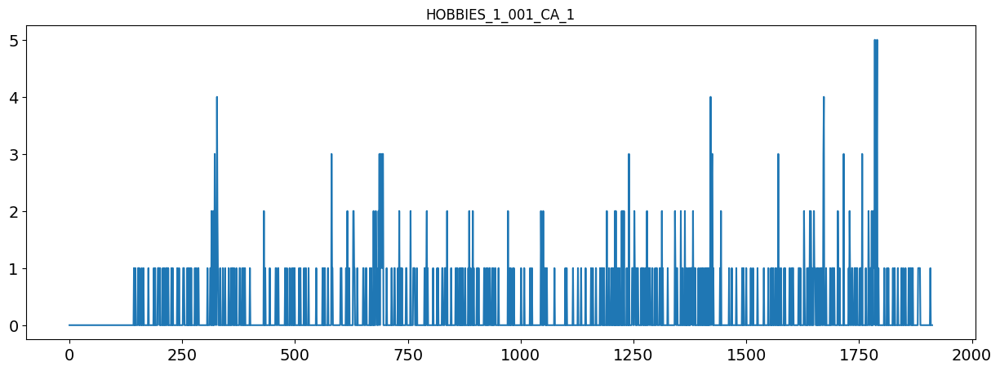

In [61]:
id_='_1'
date_df[id_].plot(figsize=(15,5), title=name_id['_0'], fontsize=14);

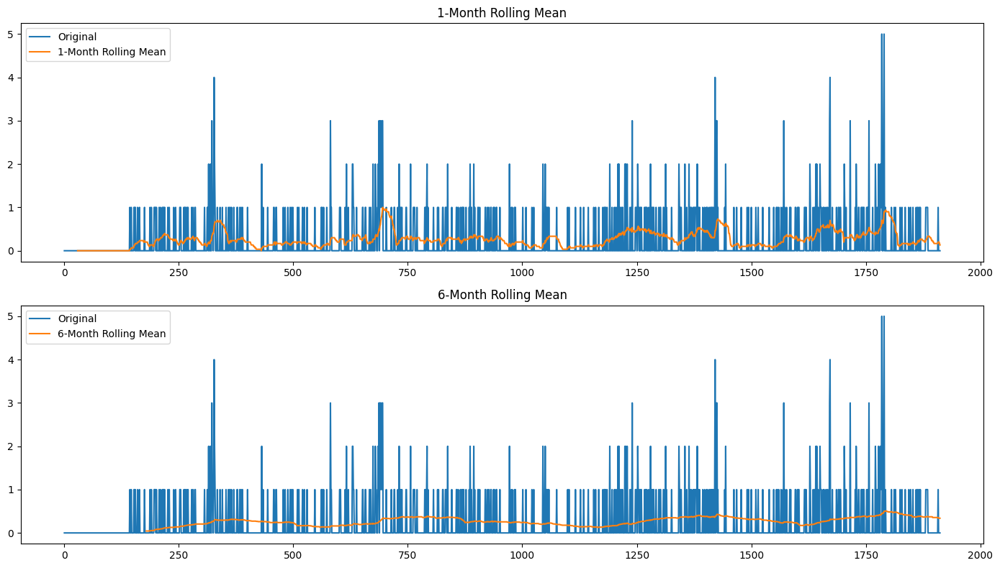

In [62]:
fig, axes = plt.subplots(2, 1, sharey=False, sharex=False)
fig.set_figwidth(14)
fig.set_figheight(8)

window = 30
date_df[id_].plot(ax=axes[0], label='Original')
date_df[id_].rolling(window=window).mean().plot(ax=axes[0], label='1-Month Rolling Mean')
axes[0].set_title("1-Month Rolling Mean")
axes[0].legend(loc='best')

window = 30*6
date_df[id_].plot(ax=axes[1], label='Original')
date_df[id_].rolling(window=window).mean().plot(ax=axes[1], label='6-Month Rolling Mean')
axes[1].set_title("6-Month Rolling Mean")
axes[1].legend(loc='best')

plt.tight_layout()
plt.show()

In [63]:
date_df['date'] = pd.to_datetime(date_df['date'])

date_df = date_df.set_index('date')

In [64]:
plt.rcParams['figure.figsize'] = 20, 5
date_df['year']  = date_df.index.year
date_df['month'] = date_df.index.month
date_df['dow']   = date_df.index.dayofweek
date_df['day']   = date_df.index.day




date_df_pivot = pd.pivot_table(date_df.loc[:,[id_,'year', 'month','dow','day']], values = id_, columns = "year", index = "month")
date_df.loc[:,[id_,'year', 'month','dow', 'day']].head(2)

,_1,year,month,dow,day
date,,,,,
2011-01-29,0,2011,1,5,29
2011-01-30,0,2011,1,6,30


#I will do a comparative analysis for each year

<Axes: xlabel='month'>

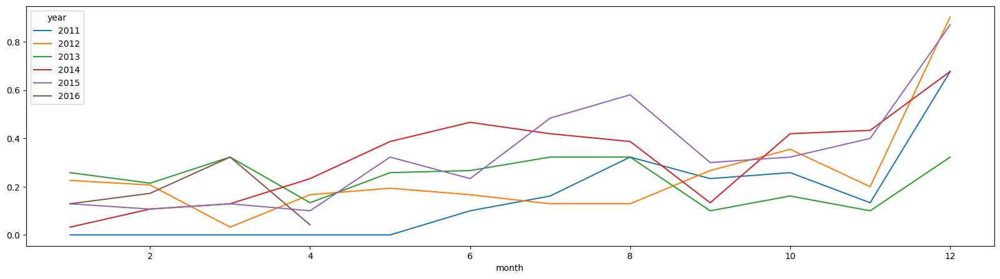

In [65]:
date_df_pivot.plot()

Comparison by year:

2011 (blue): The indicator value remains virtually unchanged throughout the year, remaining at a low level until November-December, when a sharp increase begins.

2012 (orange): The indicator also remains relatively low throughout the year, with a slight peak in April and a sharp increase in November-December.

2013 (green): This year has slightly higher numbers at the beginning of the year, with some fluctuations in the middle, and an increase at the end of the year.

2014 (red): The indicator increases from the beginning of the year, reaching a peak in May, then decreases slightly, and increases again at the end of the year.

2015 (purple): The indicator starts out low, then rises significantly in June, falls slightly in July-August, and rises sharply again in November-December.

2016 (brown): The year with the largest fluctuations throughout the year and a sharp increase at the end of the year.

It is worth noting sharp peaks at the end of the year for all years, which tells us that the New Year/Christmas holidays have an impact on this indicator :)

In [67]:
date_df

,_0,_1,_2,_3,_4,_5,_6,_7,_8,_9,...,_30484,_30485,_30486,_30487,_30488,_30489,year,month,dow,day
date,,,,,,,,,,,,,,,,,,,,,
2011-01-29,0,1,0,0,0,0,0,12,2,0,...,4,0,0,0,0,0,2011,1,5,29
2011-01-30,0,1,0,0,0,0,0,15,0,0,...,4,0,0,6,0,0,2011,1,6,30
2011-01-31,0,1,0,0,0,0,0,0,7,1,...,2,2,0,0,0,0,2011,1,0,31
2011-02-01,0,1,0,0,0,0,0,0,3,0,...,5,2,0,2,0,0,2011,2,1,1
2011-02-02,0,1,0,0,0,0,0,0,0,0,...,2,0,0,2,0,0,2011,2,2,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2016-04-20,1,2,1,0,1,0,1,4,0,0,...,0,0,0,1,1,0,2016,4,2,20
2016-04-21,3,1,0,1,2,0,0,6,0,0,...,2,1,0,0,0,0,2016,4,3,21
2016-04-22,0,1,1,3,2,2,0,3,0,2,...,3,0,0,0,3,0,2016,4,4,22


#I will create a dataset that I will use as input for baselines

In [68]:

general_dataset=sales_train_validation_df.drop(['item_id','dept_id','cat_id','store_id','state_id'], axis=1)



In [69]:
general_dataset = general_dataset.T

In [70]:
print(general_dataset.columns)

RangeIndex(start=0, stop=30490, step=1)


In [71]:
general_dataset.columns = general_dataset.iloc[0]
general_dataset = general_dataset[1:]

In [72]:
general_dataset

id,HOBBIES_1_001_CA_1_validation,HOBBIES_1_002_CA_1_validation,HOBBIES_1_003_CA_1_validation,HOBBIES_1_004_CA_1_validation,HOBBIES_1_005_CA_1_validation,HOBBIES_1_006_CA_1_validation,HOBBIES_1_007_CA_1_validation,HOBBIES_1_008_CA_1_validation,HOBBIES_1_009_CA_1_validation,HOBBIES_1_010_CA_1_validation,...,FOODS_3_818_WI_3_validation,FOODS_3_819_WI_3_validation,FOODS_3_820_WI_3_validation,FOODS_3_821_WI_3_validation,FOODS_3_822_WI_3_validation,FOODS_3_823_WI_3_validation,FOODS_3_824_WI_3_validation,FOODS_3_825_WI_3_validation,FOODS_3_826_WI_3_validation,FOODS_3_827_WI_3_validation
d_1,0,0,0,0,0,0,0,12,2,0,...,0,14,1,0,4,0,0,0,0,0
d_2,0,0,0,0,0,0,0,15,0,0,...,0,11,1,0,4,0,0,6,0,0
d_3,0,0,0,0,0,0,0,0,7,1,...,0,5,1,0,2,2,0,0,0,0
d_4,0,0,0,0,0,0,0,0,3,0,...,0,6,1,0,5,2,0,2,0,0
d_5,0,0,0,0,0,0,0,0,0,0,...,0,5,1,0,2,0,0,2,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
d_1909,1,1,1,0,1,0,1,4,0,0,...,4,1,1,0,0,0,0,1,1,0
d_1910,3,0,0,1,2,0,0,6,0,0,...,2,3,3,0,2,1,0,0,0,0
d_1911,0,0,1,3,2,2,0,3,0,2,...,0,1,6,0,3,0,0,0,3,0
d_1912,1,0,1,7,2,0,1,2,0,0,...,3,0,0,4,2,0,1,1,1,0


In [73]:
from datetime import time,timedelta,datetime,date


general_dataset['Date'] = [date(2011,1,29) + timedelta(delta) for delta in range(1913)]

In [74]:
general_dataset

id,HOBBIES_1_001_CA_1_validation,HOBBIES_1_002_CA_1_validation,HOBBIES_1_003_CA_1_validation,HOBBIES_1_004_CA_1_validation,HOBBIES_1_005_CA_1_validation,HOBBIES_1_006_CA_1_validation,HOBBIES_1_007_CA_1_validation,HOBBIES_1_008_CA_1_validation,HOBBIES_1_009_CA_1_validation,HOBBIES_1_010_CA_1_validation,...,FOODS_3_819_WI_3_validation,FOODS_3_820_WI_3_validation,FOODS_3_821_WI_3_validation,FOODS_3_822_WI_3_validation,FOODS_3_823_WI_3_validation,FOODS_3_824_WI_3_validation,FOODS_3_825_WI_3_validation,FOODS_3_826_WI_3_validation,FOODS_3_827_WI_3_validation,Date
d_1,0,0,0,0,0,0,0,12,2,0,...,14,1,0,4,0,0,0,0,0,2011-01-29
d_2,0,0,0,0,0,0,0,15,0,0,...,11,1,0,4,0,0,6,0,0,2011-01-30
d_3,0,0,0,0,0,0,0,0,7,1,...,5,1,0,2,2,0,0,0,0,2011-01-31
d_4,0,0,0,0,0,0,0,0,3,0,...,6,1,0,5,2,0,2,0,0,2011-02-01
d_5,0,0,0,0,0,0,0,0,0,0,...,5,1,0,2,0,0,2,0,0,2011-02-02
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
d_1909,1,1,1,0,1,0,1,4,0,0,...,1,1,0,0,0,0,1,1,0,2016-04-20
d_1910,3,0,0,1,2,0,0,6,0,0,...,3,3,0,2,1,0,0,0,0,2016-04-21
d_1911,0,0,1,3,2,2,0,3,0,2,...,1,6,0,3,0,0,0,3,0,2016-04-22
d_1912,1,0,1,7,2,0,1,2,0,0,...,0,0,4,2,0,1,1,1,0,2016-04-23


In [75]:
general_dataset=general_dataset.reset_index()


In [76]:
general_dataset = general_dataset.drop(['index'], axis=1)

In [77]:
general_dataset=general_dataset.T

In [78]:
general_dataset

,0,1,2,3,4,5,6,7,8,9,...,1903,1904,1905,1906,1907,1908,1909,1910,1911,1912
id,,,,,,,,,,,,,,,,,,,,,
HOBBIES_1_001_CA_1_validation,0,0,0,0,0,0,0,0,0,0,...,1,3,0,1,1,1,3,0,1,1
HOBBIES_1_002_CA_1_validation,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
HOBBIES_1_003_CA_1_validation,0,0,0,0,0,0,0,0,0,0,...,2,1,2,1,1,1,0,1,1,1
HOBBIES_1_004_CA_1_validation,0,0,0,0,0,0,0,0,0,0,...,1,0,5,4,1,0,1,3,7,2
HOBBIES_1_005_CA_1_validation,0,0,0,0,0,0,0,0,0,0,...,2,1,1,0,1,1,2,2,2,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
FOODS_3_824_WI_3_validation,0,0,0,0,0,5,0,1,1,3,...,0,0,0,0,0,0,0,0,1,0
FOODS_3_825_WI_3_validation,0,6,0,2,2,4,1,8,5,2,...,2,1,0,2,0,1,0,0,1,0
FOODS_3_826_WI_3_validation,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,1,0,3,1,3


In [79]:

new_header = general_dataset.iloc[-1]
general_dataset = general_dataset[:-1]
general_dataset.columns = new_header




In [80]:
general_dataset

Date,2011-01-29,2011-01-30,2011-01-31,2011-02-01,2011-02-02,2011-02-03,2011-02-04,2011-02-05,2011-02-06,2011-02-07,...,2016-04-15,2016-04-16,2016-04-17,2016-04-18,2016-04-19,2016-04-20,2016-04-21,2016-04-22,2016-04-23,2016-04-24
id,,,,,,,,,,,,,,,,,,,,,
HOBBIES_1_001_CA_1_validation,0,0,0,0,0,0,0,0,0,0,...,1,3,0,1,1,1,3,0,1,1
HOBBIES_1_002_CA_1_validation,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
HOBBIES_1_003_CA_1_validation,0,0,0,0,0,0,0,0,0,0,...,2,1,2,1,1,1,0,1,1,1
HOBBIES_1_004_CA_1_validation,0,0,0,0,0,0,0,0,0,0,...,1,0,5,4,1,0,1,3,7,2
HOBBIES_1_005_CA_1_validation,0,0,0,0,0,0,0,0,0,0,...,2,1,1,0,1,1,2,2,2,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
FOODS_3_823_WI_3_validation,0,0,2,2,0,3,1,4,1,0,...,2,0,0,0,0,0,1,0,0,1
FOODS_3_824_WI_3_validation,0,0,0,0,0,5,0,1,1,3,...,0,0,0,0,0,0,0,0,1,0
FOODS_3_825_WI_3_validation,0,6,0,2,2,4,1,8,5,2,...,2,1,0,2,0,1,0,0,1,0


In [81]:

general_dataset=general_dataset.reset_index()

#This dataset will be my Y during training

In [82]:
general_dataset

Date,id,2011-01-29,2011-01-30,2011-01-31,2011-02-01,2011-02-02,2011-02-03,2011-02-04,2011-02-05,2011-02-06,...,2016-04-15,2016-04-16,2016-04-17,2016-04-18,2016-04-19,2016-04-20,2016-04-21,2016-04-22,2016-04-23,2016-04-24
0,HOBBIES_1_001_CA_1_validation,0,0,0,0,0,0,0,0,0,...,1,3,0,1,1,1,3,0,1,1
1,HOBBIES_1_002_CA_1_validation,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
2,HOBBIES_1_003_CA_1_validation,0,0,0,0,0,0,0,0,0,...,2,1,2,1,1,1,0,1,1,1
3,HOBBIES_1_004_CA_1_validation,0,0,0,0,0,0,0,0,0,...,1,0,5,4,1,0,1,3,7,2
4,HOBBIES_1_005_CA_1_validation,0,0,0,0,0,0,0,0,0,...,2,1,1,0,1,1,2,2,2,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
30485,FOODS_3_823_WI_3_validation,0,0,2,2,0,3,1,4,1,...,2,0,0,0,0,0,1,0,0,1
30486,FOODS_3_824_WI_3_validation,0,0,0,0,0,5,0,1,1,...,0,0,0,0,0,0,0,0,1,0
30487,FOODS_3_825_WI_3_validation,0,6,0,2,2,4,1,8,5,...,2,1,0,2,0,1,0,0,1,0
30488,FOODS_3_826_WI_3_validation,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,1,0,3,1,3


#Creating a dataset with average prices for goods

In [86]:
import re

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import LSTM,Dropout
from keras.layers import RepeatVector,TimeDistributed
from numpy import array
from keras.models import Sequential, load_model
#import utils_paths
import re
from tqdm import tqdm
import os


In [87]:
calendar = calendar_df.copy()

In [88]:
from sklearn import preprocessing, metrics

#I will create a dataset where the average prices for the week will be marked for each product for each day

In [89]:

#Делаем LE

def transform(data):

    nan_features = ['event_name_1', 'event_type_1', 'event_name_2', 'event_type_2']
    for feature in nan_features:
        data[feature].fillna('unknown', inplace = True)

    cat = ['event_name_1','event_type_1','event_name_2','event_type_2','snap_CA','snap_TX','snap_WI']
    for feature in cat:
        encoder = preprocessing.LabelEncoder()
        data[feature] = encoder.fit_transform(data[feature])

    return data


In [90]:


days = range(1, 1970)

time_series_columns = [f'd_{i}' for i in days]
transfer_cal = pd.DataFrame(calendar[['event_name_1','event_type_1','event_name_2','event_type_2','snap_CA','snap_TX','snap_WI']].values.T, index=['event_name_1','event_type_1','event_name_2','event_type_2','snap_CA','snap_TX','snap_WI'], columns= time_series_columns)
transfer_cal = transfer_cal.fillna(0)


event_name_1_se = transfer_cal.loc['event_name_1'].apply(lambda x: x if re.search("^\d+$", str(x)) else np.nan).fillna(10)
event_name_2_se = transfer_cal.loc['event_name_2'].apply(lambda x: x if re.search("^\d+$", str(x)) else np.nan).fillna(10)


In [91]:
transfer_cal

,d_1,d_2,d_3,d_4,d_5,d_6,d_7,d_8,d_9,d_10,...,d_1960,d_1961,d_1962,d_1963,d_1964,d_1965,d_1966,d_1967,d_1968,d_1969
event_name_1,0,0,0,0,0,0,0,0,SuperBowl,0,...,0,0,0,0,0,0,0,0,0,NBAFinalsEnd
event_type_1,0,0,0,0,0,0,0,0,Sporting,0,...,0,0,0,0,0,0,0,0,0,Sporting
event_name_2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,Father's day
event_type_2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,Cultural
snap_CA,0,0,0,1,1,1,1,1,1,1,...,1,0,0,0,0,0,0,0,0,0
snap_TX,0,0,0,1,0,1,0,1,1,1,...,0,1,1,1,0,1,0,0,0,0
snap_WI,0,0,0,0,1,1,0,1,1,0,...,0,1,1,0,1,1,0,0,0,0


In [92]:
calendar['date'] = pd.to_datetime(calendar['date'])


#I will take a gap of 144 days, because, unfortunately, Goggle Collab is limited in capacity
calendar = calendar[calendar['date']>= '2016-1-27']
calendar= transform(calendar)

transfer_cal = pd.DataFrame(calendar[['event_name_1','event_type_1','event_name_2','event_type_2','snap_CA','snap_TX','snap_WI']].values.T,
                            index=['event_name_1','event_type_1','event_name_2','event_type_2','snap_CA','snap_TX','snap_WI'])
transfer_cal

<ipython-input-89-b1c610a75c98>:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[feature].fillna('unknown', inplace = True)
<ipython-input-89-b1c610a75c98>:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[feature] = encoder.fit_transform(data[feature])
<ipython-input-89-b1c610a75c98>:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-

,0,1,2,3,4,5,6,7,8,9,...,135,136,137,138,139,140,141,142,143,144
event_name_1,16,16,16,16,16,16,16,16,16,16,...,16,16,16,16,16,16,16,16,16,6
event_type_1,4,4,4,4,4,4,4,4,4,4,...,4,4,4,4,4,4,4,4,4,3
event_name_2,1,1,1,1,1,1,1,1,1,1,...,1,1,1,1,1,1,1,1,1,0
event_type_2,1,1,1,1,1,1,1,1,1,1,...,1,1,1,1,1,1,1,1,1,0
snap_CA,0,0,0,0,0,1,1,1,1,1,...,1,0,0,0,0,0,0,0,0,0
snap_TX,0,0,0,0,0,1,0,1,0,1,...,0,1,1,1,0,1,0,0,0,0
snap_WI,0,0,0,0,0,0,1,1,0,1,...,0,1,1,0,1,1,0,0,0,0


In [93]:
calendar

,date,wm_yr_wk,weekday,wday,month,year,d,event_name_1,event_type_1,event_name_2,event_type_2,snap_CA,snap_TX,snap_WI
1824,2016-01-27,11552,Wednesday,5,1,2016,d_1825,16,4,1,1,0,0,0
1825,2016-01-28,11552,Thursday,6,1,2016,d_1826,16,4,1,1,0,0,0
1826,2016-01-29,11552,Friday,7,1,2016,d_1827,16,4,1,1,0,0,0
1827,2016-01-30,11601,Saturday,1,1,2016,d_1828,16,4,1,1,0,0,0
1828,2016-01-31,11601,Sunday,2,1,2016,d_1829,16,4,1,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1964,2016-06-15,11620,Wednesday,5,6,2016,d_1965,16,4,1,1,0,1,1
1965,2016-06-16,11620,Thursday,6,6,2016,d_1966,16,4,1,1,0,0,0
1966,2016-06-17,11620,Friday,7,6,2016,d_1967,16,4,1,1,0,0,0
1967,2016-06-18,11621,Saturday,1,6,2016,d_1968,16,4,1,1,0,0,0


In [94]:
price_fea = calendar[['wm_yr_wk','date']].merge(sell_prices_df, on = ['wm_yr_wk'], how = 'left')
price_fea['id'] = price_fea['item_id']+'_'+price_fea['store_id']+'_validation'


In [95]:
price_fea

,wm_yr_wk,date,store_id,item_id,sell_price,id
0,11552,2016-01-27,CA_1,HOBBIES_1_001,8.26,HOBBIES_1_001_CA_1_validation
1,11552,2016-01-27,CA_1,HOBBIES_1_002,3.97,HOBBIES_1_002_CA_1_validation
2,11552,2016-01-27,CA_1,HOBBIES_1_003,2.97,HOBBIES_1_003_CA_1_validation
3,11552,2016-01-27,CA_1,HOBBIES_1_004,4.64,HOBBIES_1_004_CA_1_validation
4,11552,2016-01-27,CA_1,HOBBIES_1_005,2.88,HOBBIES_1_005_CA_1_validation
...,...,...,...,...,...,...
4420900,11621,2016-06-19,WI_3,FOODS_3_823,2.98,FOODS_3_823_WI_3_validation
4420901,11621,2016-06-19,WI_3,FOODS_3_824,2.48,FOODS_3_824_WI_3_validation
4420902,11621,2016-06-19,WI_3,FOODS_3_825,3.98,FOODS_3_825_WI_3_validation
4420903,11621,2016-06-19,WI_3,FOODS_3_826,1.28,FOODS_3_826_WI_3_validation


In [96]:

df = price_fea.pivot(index='id', columns='date', values='sell_price')


In [97]:
df

date,2016-01-27,2016-01-28,2016-01-29,2016-01-30,2016-01-31,2016-02-01,2016-02-02,2016-02-03,2016-02-04,2016-02-05,...,2016-06-10,2016-06-11,2016-06-12,2016-06-13,2016-06-14,2016-06-15,2016-06-16,2016-06-17,2016-06-18,2016-06-19
id,,,,,,,,,,,,,,,,,,,,,
FOODS_1_001_CA_1_validation,2.24,2.24,2.24,2.24,2.24,2.24,2.24,2.24,2.24,2.24,...,2.24,2.24,2.24,2.24,2.24,2.24,2.24,2.24,2.24,2.24
FOODS_1_001_CA_2_validation,2.24,2.24,2.24,2.24,2.24,2.24,2.24,2.24,2.24,2.24,...,2.24,2.24,2.24,2.24,2.24,2.24,2.24,2.24,2.24,2.24
FOODS_1_001_CA_3_validation,2.24,2.24,2.24,2.24,2.24,2.24,2.24,2.24,2.24,2.24,...,2.24,2.24,2.24,2.24,2.24,2.24,2.24,2.24,2.24,2.24
FOODS_1_001_CA_4_validation,2.24,2.24,2.24,2.24,2.24,2.24,2.24,2.24,2.24,2.24,...,2.24,2.24,2.24,2.24,2.24,2.24,2.24,2.24,2.24,2.24
FOODS_1_001_TX_1_validation,2.24,2.24,2.24,2.24,2.24,2.24,2.24,2.24,2.24,2.24,...,2.24,2.24,2.24,2.24,2.24,2.24,2.24,2.24,2.24,2.24
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
HOUSEHOLD_2_516_TX_2_validation,5.94,5.94,5.94,5.94,5.94,5.94,5.94,5.94,5.94,5.94,...,5.94,5.94,5.94,5.94,5.94,5.94,5.94,5.94,5.94,5.94
HOUSEHOLD_2_516_TX_3_validation,5.94,5.94,5.94,5.94,5.94,5.94,5.94,5.94,5.94,5.94,...,5.94,5.94,5.94,5.94,5.94,5.94,5.94,5.94,5.94,5.94
HOUSEHOLD_2_516_WI_1_validation,5.94,5.94,5.94,5.94,5.94,5.94,5.94,5.94,5.94,5.94,...,5.94,5.94,5.94,5.94,5.94,5.94,5.94,5.94,5.94,5.94


In [98]:
df=df.reset_index()

In [99]:
df

date,id,2016-01-27 00:00:00,2016-01-28 00:00:00,2016-01-29 00:00:00,2016-01-30 00:00:00,2016-01-31 00:00:00,2016-02-01 00:00:00,2016-02-02 00:00:00,2016-02-03 00:00:00,2016-02-04 00:00:00,...,2016-06-10 00:00:00,2016-06-11 00:00:00,2016-06-12 00:00:00,2016-06-13 00:00:00,2016-06-14 00:00:00,2016-06-15 00:00:00,2016-06-16 00:00:00,2016-06-17 00:00:00,2016-06-18 00:00:00,2016-06-19 00:00:00
0,FOODS_1_001_CA_1_validation,2.24,2.24,2.24,2.24,2.24,2.24,2.24,2.24,2.24,...,2.24,2.24,2.24,2.24,2.24,2.24,2.24,2.24,2.24,2.24
1,FOODS_1_001_CA_2_validation,2.24,2.24,2.24,2.24,2.24,2.24,2.24,2.24,2.24,...,2.24,2.24,2.24,2.24,2.24,2.24,2.24,2.24,2.24,2.24
2,FOODS_1_001_CA_3_validation,2.24,2.24,2.24,2.24,2.24,2.24,2.24,2.24,2.24,...,2.24,2.24,2.24,2.24,2.24,2.24,2.24,2.24,2.24,2.24
3,FOODS_1_001_CA_4_validation,2.24,2.24,2.24,2.24,2.24,2.24,2.24,2.24,2.24,...,2.24,2.24,2.24,2.24,2.24,2.24,2.24,2.24,2.24,2.24
4,FOODS_1_001_TX_1_validation,2.24,2.24,2.24,2.24,2.24,2.24,2.24,2.24,2.24,...,2.24,2.24,2.24,2.24,2.24,2.24,2.24,2.24,2.24,2.24
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
30485,HOUSEHOLD_2_516_TX_2_validation,5.94,5.94,5.94,5.94,5.94,5.94,5.94,5.94,5.94,...,5.94,5.94,5.94,5.94,5.94,5.94,5.94,5.94,5.94,5.94
30486,HOUSEHOLD_2_516_TX_3_validation,5.94,5.94,5.94,5.94,5.94,5.94,5.94,5.94,5.94,...,5.94,5.94,5.94,5.94,5.94,5.94,5.94,5.94,5.94,5.94
30487,HOUSEHOLD_2_516_WI_1_validation,5.94,5.94,5.94,5.94,5.94,5.94,5.94,5.94,5.94,...,5.94,5.94,5.94,5.94,5.94,5.94,5.94,5.94,5.94,5.94
30488,HOUSEHOLD_2_516_WI_2_validation,5.94,5.94,5.94,5.94,5.94,5.94,5.94,5.94,5.94,...,5.94,5.94,5.94,5.94,5.94,5.94,5.94,5.94,5.94,5.94


In [100]:
price_df = sales_train_validation_df.merge(df,on=['id'],how= 'left').iloc[:,-145:]
price_df.index = sales_train_validation_df.id
price_df.head()

,2016-01-27,2016-01-28,2016-01-29,2016-01-30,2016-01-31,2016-02-01,2016-02-02,2016-02-03,2016-02-04,2016-02-05,...,2016-06-10,2016-06-11,2016-06-12,2016-06-13,2016-06-14,2016-06-15,2016-06-16,2016-06-17,2016-06-18,2016-06-19
id,,,,,,,,,,,,,,,,,,,,,
HOBBIES_1_001_CA_1_validation,8.26,8.26,8.26,8.26,8.26,8.26,8.26,8.26,8.26,8.26,...,8.38,8.38,8.38,8.38,8.38,8.38,8.38,8.38,8.38,8.38
HOBBIES_1_002_CA_1_validation,3.97,3.97,3.97,3.97,3.97,3.97,3.97,3.97,3.97,3.97,...,3.97,3.97,3.97,3.97,3.97,3.97,3.97,3.97,3.97,3.97
HOBBIES_1_003_CA_1_validation,2.97,2.97,2.97,2.97,2.97,2.97,2.97,2.97,2.97,2.97,...,2.97,2.97,2.97,2.97,2.97,2.97,2.97,2.97,2.97,2.97
HOBBIES_1_004_CA_1_validation,4.64,4.64,4.64,4.64,4.64,4.64,4.64,4.64,4.64,4.64,...,4.64,4.64,4.64,4.64,4.64,4.64,4.64,4.64,4.64,4.64
HOBBIES_1_005_CA_1_validation,2.88,2.88,2.88,2.88,2.88,2.88,2.88,2.88,2.88,2.88,...,2.88,2.88,2.88,2.88,2.88,2.88,2.88,2.88,2.88,2.88


In [101]:
days = range(1, 1913 + 1)
time_series_columns = [f'd_{i}' for i in days]


#time series data
time_series_data = sales_train_validation_df[time_series_columns]

#I will check the relationship between event and sales

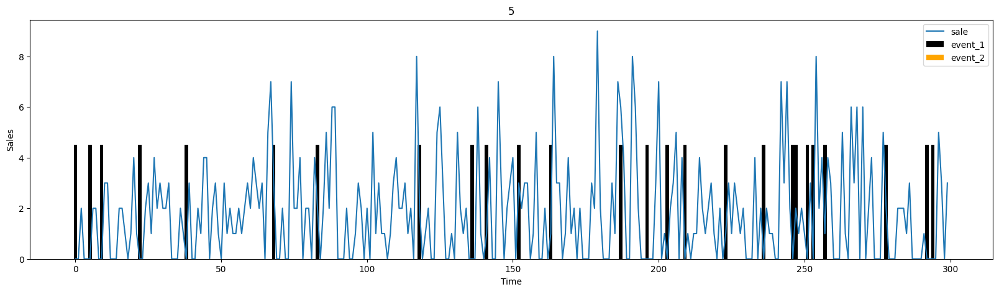

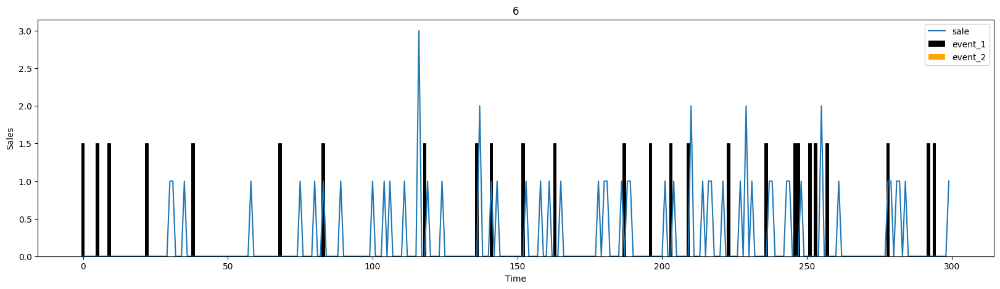

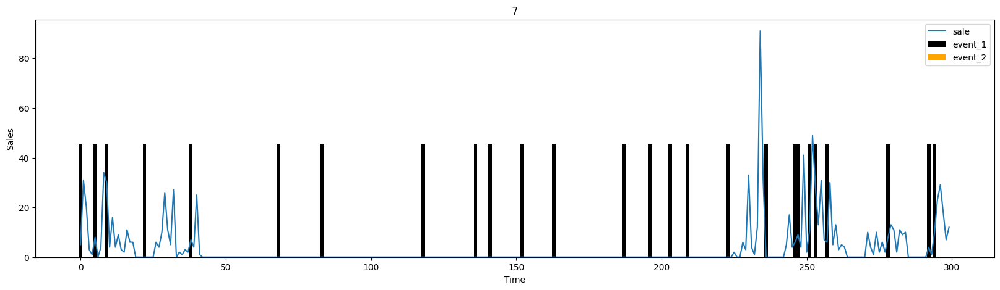

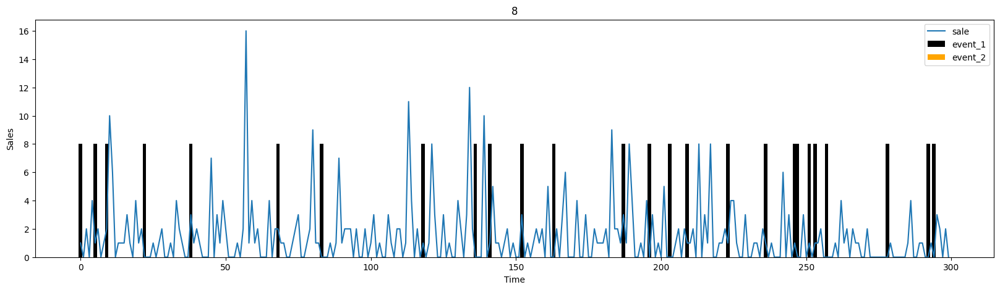

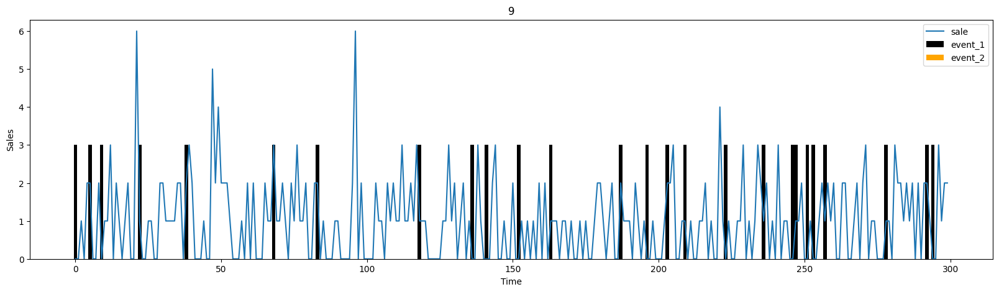

In [103]:
for i in range(5,10):
    fig =plt.figure(figsize= (20, 5))
    ax = fig.add_subplot(1, 1, 1)


    ax.plot(time_series_data.iloc[i, 500:800].values,label='sales')
    ax.bar(x = range(300),height = event_name_1_se[500:800].values*0.05*time_series_data.iloc[i, 500:800].values.max(),label='type_1',facecolor='black',width=1.2)

    ax.bar(x = range(300),height = event_name_2_se[500:800].values*0.05*time_series_data.iloc[i, 500:800].values.max(),label='type_2',facecolor='orange',width=1.2)
    plt.legend(['sale','event_1','event_2'])

    ax.set_title(str(i))

    ax.set_xlabel('Time')
    ax.set_ylabel('Sales')

Although it is impossible for a person to study 30,490 graphs on his own, it is clear that there is some dependence. Therefore, we will assume that events are a rather important parameter

In [104]:
transfer_cal

,0,1,2,3,4,5,6,7,8,9,...,135,136,137,138,139,140,141,142,143,144
event_name_1,16,16,16,16,16,16,16,16,16,16,...,16,16,16,16,16,16,16,16,16,6
event_type_1,4,4,4,4,4,4,4,4,4,4,...,4,4,4,4,4,4,4,4,4,3
event_name_2,1,1,1,1,1,1,1,1,1,1,...,1,1,1,1,1,1,1,1,1,0
event_type_2,1,1,1,1,1,1,1,1,1,1,...,1,1,1,1,1,1,1,1,1,0
snap_CA,0,0,0,0,0,1,1,1,1,1,...,1,0,0,0,0,0,0,0,0,0
snap_TX,0,0,0,0,0,1,0,1,0,1,...,0,1,1,1,0,1,0,0,0,0
snap_WI,0,0,0,0,0,0,1,1,0,1,...,0,1,1,0,1,1,0,0,0,0


#I will create a dataset X, during training on which I will test my hypothesis that purchases directly depend on holidays and SNAPs

In [105]:

X = []
for i in tqdm(range(time_series_data.shape[0])):
    X.append([list(t) for t in zip(transfer_cal.loc['event_name_1'][:],
                                   transfer_cal.loc['event_type_1'][:],
                                   transfer_cal.loc['event_name_2'][:],
                                   transfer_cal.loc['event_type_2'][:],
                                   transfer_cal.loc['snap_CA'][:],
                                   transfer_cal.loc['snap_TX'][:],
                                   transfer_cal.loc['snap_WI'][:],
                                   price_df.iloc[i][:],
                                   time_series_data.iloc[i][:])])

X = np.asarray(X, dtype=np.float32)




100%|██████████| 30490/30490 [00:48<00:00, 633.70it/s]


In [106]:
transfer_cal

,0,1,2,3,4,5,6,7,8,9,...,135,136,137,138,139,140,141,142,143,144
event_name_1,16,16,16,16,16,16,16,16,16,16,...,16,16,16,16,16,16,16,16,16,6
event_type_1,4,4,4,4,4,4,4,4,4,4,...,4,4,4,4,4,4,4,4,4,3
event_name_2,1,1,1,1,1,1,1,1,1,1,...,1,1,1,1,1,1,1,1,1,0
event_type_2,1,1,1,1,1,1,1,1,1,1,...,1,1,1,1,1,1,1,1,1,0
snap_CA,0,0,0,0,0,1,1,1,1,1,...,1,0,0,0,0,0,0,0,0,0
snap_TX,0,0,0,0,0,1,0,1,0,1,...,0,1,1,1,0,1,0,0,0,0
snap_WI,0,0,0,0,0,0,1,1,0,1,...,0,1,1,0,1,1,0,0,0,0


In [112]:
time_series_data

,d_1,d_2,d_3,d_4,d_5,d_6,d_7,d_8,d_9,d_10,...,d_1904,d_1905,d_1906,d_1907,d_1908,d_1909,d_1910,d_1911,d_1912,d_1913
0,0,0,0,0,0,0,0,0,0,0,...,1,3,0,1,1,1,3,0,1,1
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,2,1,2,1,1,1,0,1,1,1
3,0,0,0,0,0,0,0,0,0,0,...,1,0,5,4,1,0,1,3,7,2
4,0,0,0,0,0,0,0,0,0,0,...,2,1,1,0,1,1,2,2,2,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
30485,0,0,2,2,0,3,1,4,1,0,...,2,0,0,0,0,0,1,0,0,1
30486,0,0,0,0,0,5,0,1,1,3,...,0,0,0,0,0,0,0,0,1,0
30487,0,6,0,2,2,4,1,8,5,2,...,2,1,0,2,0,1,0,0,1,0
30488,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,1,0,3,1,3


In [ ]:
X

array([[[16.  ,  4.  ,  1.  , ...,  0.  ,  8.26,  0.  ],
        [16.  ,  4.  ,  1.  , ...,  0.  ,  8.26,  0.  ],
        [16.  ,  4.  ,  1.  , ...,  0.  ,  8.26,  0.  ],
        ...,
        [16.  ,  4.  ,  1.  , ...,  0.  ,  8.38,  0.  ],
        [16.  ,  4.  ,  1.  , ...,  0.  ,  8.38,  0.  ],
        [ 6.  ,  3.  ,  0.  , ...,  0.  ,  8.38,  0.  ]],

       [[16.  ,  4.  ,  1.  , ...,  0.  ,  3.97,  0.  ],
        [16.  ,  4.  ,  1.  , ...,  0.  ,  3.97,  0.  ],
        [16.  ,  4.  ,  1.  , ...,  0.  ,  3.97,  0.  ],
        ...,
        [16.  ,  4.  ,  1.  , ...,  0.  ,  3.97,  0.  ],
        [16.  ,  4.  ,  1.  , ...,  0.  ,  3.97,  1.  ],
        [ 6.  ,  3.  ,  0.  , ...,  0.  ,  3.97,  0.  ]],

       [[16.  ,  4.  ,  1.  , ...,  0.  ,  2.97,  0.  ],
        [16.  ,  4.  ,  1.  , ...,  0.  ,  2.97,  0.  ],
        [16.  ,  4.  ,  1.  , ...,  0.  ,  2.97,  0.  ],
        ...,
        [16.  ,  4.  ,  1.  , ...,  0.  ,  2.97,  0.  ],
        [16.  ,  4.  ,  1.  , ...,  0.  ,  2.

In [113]:

def Normalize(list):
    list = np.array(list)
    low, high = np.percentile(list, [0, 100])
    delta = high - low
    if delta != 0:
        for i in range(0, len(list)):
            list[i] = (list[i]-low)/delta
    return  list,low,high

def FNoramlize(list,low,high):
    delta = high - low
    if delta != 0:
        for i in range(0, len(list)):
            list[i] = list[i]*delta + low
    return list

def Normalize2(list,low,high):
    list = np.array(list)
    delta = high - low
    if delta != 0:
        for i in range(0, len(list)):
            list[i] = (list[i]-low)/delta
    return  list


In [114]:
X

array([[[16.  ,  4.  ,  1.  , ...,  0.  ,  8.26,  0.  ],
        [16.  ,  4.  ,  1.  , ...,  0.  ,  8.26,  0.  ],
        [16.  ,  4.  ,  1.  , ...,  0.  ,  8.26,  0.  ],
        ...,
        [16.  ,  4.  ,  1.  , ...,  0.  ,  8.38,  0.  ],
        [16.  ,  4.  ,  1.  , ...,  0.  ,  8.38,  0.  ],
        [ 6.  ,  3.  ,  0.  , ...,  0.  ,  8.38,  0.  ]],

       [[16.  ,  4.  ,  1.  , ...,  0.  ,  3.97,  0.  ],
        [16.  ,  4.  ,  1.  , ...,  0.  ,  3.97,  0.  ],
        [16.  ,  4.  ,  1.  , ...,  0.  ,  3.97,  0.  ],
        ...,
        [16.  ,  4.  ,  1.  , ...,  0.  ,  3.97,  0.  ],
        [16.  ,  4.  ,  1.  , ...,  0.  ,  3.97,  1.  ],
        [ 6.  ,  3.  ,  0.  , ...,  0.  ,  3.97,  0.  ]],

       [[16.  ,  4.  ,  1.  , ...,  0.  ,  2.97,  0.  ],
        [16.  ,  4.  ,  1.  , ...,  0.  ,  2.97,  0.  ],
        [16.  ,  4.  ,  1.  , ...,  0.  ,  2.97,  0.  ],
        ...,
        [16.  ,  4.  ,  1.  , ...,  0.  ,  2.97,  0.  ],
        [16.  ,  4.  ,  1.  , ...,  0.  ,  2.

In [115]:
print(len(X))
print(len(X[0]))
print(len(X[0][0]))

30490
145
9


In [116]:
np.random.seed(7)


n_steps = 28

train_n,train_low,train_high = Normalize(X[:,-(n_steps*2):,:])
X_train = train_n[:,-28*2:-28,:]
y = train_n[:,-28:,8]  #


In [117]:
train_n

array([[[0.02523659, 0.00630915, 0.00157729, ..., 0.        ,
         0.01321767, 0.        ],
        [0.02523659, 0.00630915, 0.00157729, ..., 0.        ,
         0.01321767, 0.        ],
        [0.02523659, 0.00630915, 0.00157729, ..., 0.        ,
         0.01321767, 0.        ],
        ...,
        [0.02523659, 0.00630915, 0.00157729, ..., 0.        ,
         0.01321767, 0.        ],
        [0.02523659, 0.00630915, 0.00157729, ..., 0.        ,
         0.01321767, 0.        ],
        [0.00946372, 0.00473186, 0.        , ..., 0.        ,
         0.01321767, 0.        ]],

       [[0.02523659, 0.00630915, 0.00157729, ..., 0.        ,
         0.00626183, 0.        ],
        [0.02523659, 0.00630915, 0.00157729, ..., 0.        ,
         0.00626183, 0.        ],
        [0.02523659, 0.00630915, 0.00157729, ..., 0.        ,
         0.00626183, 0.        ],
        ...,
        [0.02523659, 0.00630915, 0.00157729, ..., 0.        ,
         0.00626183, 0.        ],
        [0.0

In [118]:
print(len(train_n))
print(len(train_n[0]))
print(len(train_n[1][0]))

30490
56
9


In [119]:
print(len(X_train))
print(len(X_train[0]))
print(len(X_train[0][1]))

30490
28
9


#Predict is 28 days for each of 30490 products

In [120]:
print(len(y))
print(len(y[0]))

30490
28


In [121]:
# reshape from [samples, timesteps] into [samples, timesteps, features]
n_features = 9
n_out_seq_length =28
num_y = 1
X_train = X_train.reshape((X_train.shape[0], X_train.shape[1], n_features))
y = y.reshape((y.shape[0], y.shape[1], 1))
print(X_train.shape)


(30490, 28, 9)


In [122]:
print(len(X_train))
print(len(X_train[0]))
print(len(X_train[0][1]))
print(len(X_train[0][1]))

30490
28
9
9


In [123]:
print(X_train)

[[[0.02523659 0.00630915 0.00157729 ... 0.         0.01321767 0.        ]
  [0.02523659 0.00630915 0.00157729 ... 0.         0.01321767 0.        ]
  [0.02523659 0.00630915 0.00157729 ... 0.         0.01321767 0.        ]
  ...
  [0.02523659 0.00630915 0.00157729 ... 0.         0.01321767 0.        ]
  [0.02523659 0.00630915 0.00157729 ... 0.         0.01321767 0.        ]
  [0.02523659 0.00630915 0.00157729 ... 0.         0.01321767 0.        ]]

 [[0.02523659 0.00630915 0.00157729 ... 0.         0.00626183 0.        ]
  [0.02523659 0.00630915 0.00157729 ... 0.         0.00626183 0.        ]
  [0.02523659 0.00630915 0.00157729 ... 0.         0.00626183 0.        ]
  ...
  [0.02523659 0.00630915 0.00157729 ... 0.         0.00626183 0.        ]
  [0.02523659 0.00630915 0.00157729 ... 0.         0.00626183 0.        ]
  [0.02523659 0.00630915 0.00157729 ... 0.         0.00626183 0.        ]]

 [[0.02523659 0.00630915 0.00157729 ... 0.         0.00468454 0.        ]
  [0.02523659 0.006309

#Because The LSTM model copes well with time series, so I will train it

In [124]:
model = Sequential()


model.add(LSTM(128, activation='relu', input_shape=(28, n_features),return_sequences=False))
model.add(RepeatVector(n_out_seq_length))
model.add(LSTM(32, activation='relu',return_sequences=True))
#model.add(Dropout(0.1))
model.add(TimeDistributed(Dense(num_y)))

model.compile(optimizer='adam', loss='mse')
# demonstrate prediction
model.fit(X_train, y, epochs=10, batch_size=1000)

Epoch 1/10
31/31 [==============================] - 24s 623ms/step - loss: 2.3571e-05
Epoch 2/10
31/31 [==============================] - 17s 547ms/step - loss: 1.4915e-05
Epoch 3/10
31/31 [==============================] - 21s 672ms/step - loss: 1.0574e-05
Epoch 4/10
31/31 [==============================] - 18s 568ms/step - loss: 1.0191e-05
Epoch 5/10
31/31 [==============================] - 36s 1s/step - loss: 9.9395e-06
Epoch 6/10
31/31 [==============================] - 36s 1s/step - loss: 9.8583e-06
Epoch 7/10
31/31 [==============================] - 19s 600ms/step - loss: 9.9081e-06
Epoch 8/10
31/31 [==============================] - 18s 588ms/step - loss: 9.8865e-06
Epoch 9/10
31/31 [==============================] - 17s 545ms/step - loss: 9.8822e-06
Epoch 10/10
31/31 [==============================] - 32s 1s/step - loss: 9.9162e-06


In [125]:
print(len(y))
print(len(y[0]))

30490
28


In [126]:
num = 30490

In [127]:
x_input = array(X_train[:,-n_steps*1:])
x_input = x_input.reshape((num, n_steps*1, n_features))
print(x_input.shape)

yhat = model.predict(x_input[:,-n_steps:], verbose=0)
x_input=np.concatenate((x_input[:,:,8].reshape(x_input.shape[0],x_input.shape[1]),yhat.astype(np.float32).reshape(x_input.shape[0],x_input.shape[1])),axis=1).reshape((x_input.shape[0],x_input.shape[1]+28,1))

print(x_input.shape)

(30490, 28, 9)
(30490, 56, 1)


In [128]:
x_input = FNoramlize(x_input,train_low,train_high)
x_input = np.rint(x_input)

In [129]:
forecast = pd.DataFrame(x_input.reshape(x_input.shape[0],x_input.shape[1])).iloc[:,-28:]
forecast.columns = [f'F{i}' for i in range(1, forecast.shape[1] + 1)]
forecast[forecast < 0] =0
forecast[forecast <= -0] =0

In [130]:
forecast

,F1,F2,F3,F4,F5,F6,F7,F8,F9,F10,...,F19,F20,F21,F22,F23,F24,F25,F26,F27,F28
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
4,1.0,1.0,1.0,1.0,1.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
30485,1.0,1.0,1.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0
30486,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
30487,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
30488,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


#HOORAY!

#**I'll make a target dataset**

In [63]:
target_dates = [f'd_{i}' for i in range(1914, 1942)]

In [64]:
test = sales_train_evaluation_df[target_dates]

In [65]:
test

,d_1914,d_1915,d_1916,d_1917,d_1918,d_1919,d_1920,d_1921,d_1922,d_1923,...,d_1932,d_1933,d_1934,d_1935,d_1936,d_1937,d_1938,d_1939,d_1940,d_1941
0,0,0,0,2,0,3,5,0,0,1,...,2,4,0,0,0,0,3,3,0,1
1,0,1,0,0,0,0,0,0,0,1,...,0,1,2,1,1,0,0,0,0,0
2,0,0,1,1,0,2,1,0,0,0,...,1,0,2,0,0,0,2,3,0,1
3,0,0,1,2,4,1,6,4,0,0,...,1,1,0,4,0,1,3,0,2,6
4,1,0,2,3,1,0,3,2,3,1,...,0,0,0,2,1,0,0,2,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
30485,0,0,0,2,2,0,0,0,2,0,...,1,0,3,0,1,1,0,0,1,1
30486,0,1,1,1,0,0,0,0,1,0,...,0,0,0,0,0,0,1,0,1,0
30487,0,0,1,1,0,2,1,1,0,0,...,0,0,1,2,0,1,0,1,0,2
30488,1,3,0,1,2,1,0,2,1,1,...,1,1,1,4,6,0,1,1,1,0


#**Loss functions:**

In [134]:
from sklearn.metrics import mean_squared_error
from math import sqrt

def rmse(y_actual, y_predicted):
    rmse = sqrt(mean_squared_error(y_actual, y_predicted))
    return rmse

# mean_absolute_percentage_error
def mape(y_true, y_pred):
    y_true = np.asarray(y_true)+1
    y_pred = np.asarray(y_pred)+1
    return np.mean(np.abs((y_true - y_pred) /y_true)) * 100

# Root Mean Squared Scaled Error
def rmsse(y_train, y_true, y_pred):

  y_train, y_true, y_pred = np.asarray(y_train), np.asarray(y_true), np.asarray(y_pred)

  above = np.mean((y_true-y_pred)**2)
  below = ((y_train - np.roll(y_train, 1))[1:]**2).mean() + 1e-10

  return sqrt(above/below)

In [135]:
print(test.shape)
print(forecast.shape)

(30490, 28)
(30490, 28)


In [136]:
LSTM_1_mape=mape(test,forecast)

51.03423091270405

In [137]:
LSTM_1_rmse=rmse(test,forecast)

3.630871938796085

In [138]:
LSTM_1_rmsse=rmsse(X_train,test,forecast)

337.4562678968326

In [139]:
LSTM_1_MSE=mean_squared_error(test,forecast)

13.18323103593684

In [158]:
forecast

,F1,F2,F3,F4,F5,F6,F7,F8,F9,F10,...,F19,F20,F21,F22,F23,F24,F25,F26,F27,F28
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
4,1.0,1.0,1.0,1.0,1.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
30485,1.0,1.0,1.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0
30486,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
30487,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
30488,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [67]:
import numpy as np
from sklearn.metrics import mean_squared_error
from math import sqrt
def calculate_metrics(y_train, y_true, y_pred):

    y_train = np.asarray(y_train, dtype=np.float64)
    y_true = np.asarray(y_true, dtype=np.float64)
    y_pred = np.asarray(y_pred, dtype=np.float64)
    # Root Mean Squared Error (RMSE)
    rmse = sqrt(mean_squared_error(y_true, y_pred))
    mse=mean_squared_error(y_true, y_pred)
    # Mean Absolute Percentage Error (MAPE)
    y_true_np = np.asarray(y_true) + 1
    y_pred_np = np.asarray(y_pred) + 1
    mape = np.mean(np.abs((y_true_np - y_pred_np) / y_true_np)) * 100

    # Root Mean Squared Scaled Error (RMSSE)
    y_train_np, y_true_np, y_pred_np = np.asarray(y_train), np.asarray(y_true), np.asarray(y_pred)
    above = np.mean((y_true_np - y_pred_np)**2)
    below = ((y_train_np - np.roll(y_train_np, 1))[1:]**2).mean() + 1e-10
    rmsse = sqrt(above / below)

    return [mse,rmse, mape, rmsse]

#**I'll make the next baselines:**
#1. Mean
#2. Last year mean
#3. Naive:What quantity of a product was purchased 28 days ago, the same quantity will be purchased in the next 28 days.
#4. Last: What purchases were yesterday, will be the same for the next 28 days.
#5. Naive Seasonal: Any purchases made a year ago on the same day will be completed on the same day.


In time series problems, it is extremely important to build baselines. Because sometimes they give excellent results)
#I will use a period of 2 years for prediction

In [140]:
import numpy as np
import pandas as pd

def rolling_forecast(df: np.ndarray, train_len: int, horizon: int, method: str) -> np.ndarray:

    if method == 'mean':
        train_mean = np.mean(df)
        return np.full(horizon, train_mean)

    elif method == 'last year mean':
        last_year_mean = np.mean(df[-365:])
        return np.full(horizon, last_year_mean)

    elif method == 'naive':
        return df[-horizon:]

    elif method == 'last':
        #print(df[-1])
        #print(df)
        return np.full(horizon, df[-1])

    elif method =='Naive Seasonal':

        start_index = len(df) - 365
        #our year
        seasonal_values = df[start_index:start_index + 365]
        #print(len(seasonal_values),"!")

        # We create a forecast for horizon days using data for the same period in the previous year
        forecast = np.zeros(horizon)
        for i in range(horizon):
            forecast[i] = seasonal_values[i]
        return forecast




def apply_forecast(df: pd.DataFrame, train_len: int, horizon: int, method: str) -> pd.DataFrame:
    forecast_results = []


    for index, row in df.iterrows():
        series_id = row[0]
        series_values = row[1:].values
        #print(index,row,"!")
        #print(series_id,series_values)
        #break

        forecast = rolling_forecast(series_values, train_len, horizon, method)
        #break

        forecast_results.append([series_id] + list(forecast))


    forecast_columns = [f'F_{i+1}' for i in range(horizon)]
    forecast_df = pd.DataFrame(forecast_results, columns=['id'] + forecast_columns)

    return forecast_df


In [160]:
#I will use a period of 2 years for prediction
train_len = 730
horizon = 28

forecast_df_mean = apply_forecast(general_dataset, train_len, horizon, method='mean').drop(columns=['id'])


In [161]:
errors_mean=calculate_metrics(X_train,forecast_df_mean,test)

In [162]:
errors_mean

[6.5702842270890525,
 2.5632565667699074,
 50.354109945645874,
 238.23114187408007]

In [163]:
forecast_df_naive = apply_forecast(general_dataset, train_len, horizon, method='naive').drop(columns=['id'])


In [165]:
errors_naive=calculate_metrics(X_train,forecast_df_naive,test)

In [166]:
errors_naive

[8.004191069671554, 2.8291679111837027, 59.60988750012564, 262.94515764535294]

In [169]:
forecast_df_last_year_mean = apply_forecast(general_dataset, train_len, horizon, method='last year mean').drop(columns=['id'])


In [173]:
errors_last_year_mean=calculate_metrics(X_train,forecast_df_last_year_mean,test)

In [174]:
errors_last_year_mean

[5.500139706914857, 2.3452376653368967, 44.51988147012098, 217.96828855231158]

In [176]:
forecast_df_last = apply_forecast(general_dataset, train_len, horizon, method='last').drop(columns=['id'])

In [177]:
errors_last=calculate_metrics(X_train,forecast_df_last,test)

In [178]:
errors_last

[8.372670196317294, 2.893556668931385, 55.630433025100466, 268.9295009533714]

In [164]:
forecast_df_Seasonal = apply_forecast(general_dataset, train_len, horizon, method='Naive Seasonal').drop(columns=['id'])

In [179]:
errors_Seasonal=calculate_metrics(X_train,forecast_df_Seasonal ,test)

In [180]:
errors_Seasonal

[10.179233238064002, 3.1904910653477785, 73.19315770094354, 296.5268243103189]

#**Now I will train the XGBRegressor model to predict product sales for each of the 28 days.**

In [47]:
train_df=sales_train_validation_df.copy()

In [22]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30490 entries, 0 to 30489
Columns: 1919 entries, id to d_1913
dtypes: int64(1913), object(6)
memory usage: 446.4+ MB


In [50]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30490 entries, 0 to 30489
Columns: 1919 entries, id to d_1913
dtypes: int16(1913), object(6)
memory usage: 112.6+ MB


In [51]:
train_df = train_df.T

In [52]:
train_df = train_df[6:]

In [53]:
train_df

,0,1,2,3,4,5,6,7,8,9,...,30480,30481,30482,30483,30484,30485,30486,30487,30488,30489
d_1,0,0,0,0,0,0,0,12,2,0,...,0,14,1,0,4,0,0,0,0,0
d_2,0,0,0,0,0,0,0,15,0,0,...,0,11,1,0,4,0,0,6,0,0
d_3,0,0,0,0,0,0,0,0,7,1,...,0,5,1,0,2,2,0,0,0,0
d_4,0,0,0,0,0,0,0,0,3,0,...,0,6,1,0,5,2,0,2,0,0
d_5,0,0,0,0,0,0,0,0,0,0,...,0,5,1,0,2,0,0,2,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
d_1909,1,1,1,0,1,0,1,4,0,0,...,4,1,1,0,0,0,0,1,1,0
d_1910,3,0,0,1,2,0,0,6,0,0,...,2,3,3,0,2,1,0,0,0,0
d_1911,0,0,1,3,2,2,0,3,0,2,...,0,1,6,0,3,0,0,0,3,0
d_1912,1,0,1,7,2,0,1,2,0,0,...,3,0,0,4,2,0,1,1,1,0


In [2]:
!pip install tensorflow


##Because Google Collab does not have enough computing power and since Google Collab writes that “The session was terminated because the amount of RAM is completely exhausted,” then for each product I will use the data for the last 100 days.

In [54]:
train_df_1=train_df[-100:]

In [20]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import StandardScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense
from tensorflow.keras.preprocessing.sequence import TimeseriesGenerator

In [18]:
train_df_1=train_df_1.T
train_df_1=train_df_1[6:]

In [19]:
train_df_1

,id,item_id,dept_id,cat_id,store_id,state_id,d_1,d_2,d_3,d_4,...,d_1904,d_1905,d_1906,d_1907,d_1908,d_1909,d_1910,d_1911,d_1912,d_1913
30396,FOODS_3_733_WI_3_validation,FOODS_3_733,FOODS_3,FOODS,WI_3,WI,0,0,0,0,...,3,1,2,1,2,0,2,0,1,2
30397,FOODS_3_734_WI_3_validation,FOODS_3_734,FOODS_3,FOODS,WI_3,WI,0,0,0,0,...,13,0,0,4,8,5,4,7,8,6
30398,FOODS_3_735_WI_3_validation,FOODS_3_735,FOODS_3,FOODS,WI_3,WI,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
30399,FOODS_3_736_WI_3_validation,FOODS_3_736,FOODS_3,FOODS,WI_3,WI,2,2,1,1,...,0,0,0,0,0,0,1,0,1,0
30400,FOODS_3_737_WI_3_validation,FOODS_3_737,FOODS_3,FOODS,WI_3,WI,0,0,0,0,...,0,0,0,0,0,1,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
30485,FOODS_3_823_WI_3_validation,FOODS_3_823,FOODS_3,FOODS,WI_3,WI,0,0,2,2,...,2,0,0,0,0,0,1,0,0,1
30486,FOODS_3_824_WI_3_validation,FOODS_3_824,FOODS_3,FOODS,WI_3,WI,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
30487,FOODS_3_825_WI_3_validation,FOODS_3_825,FOODS_3,FOODS,WI_3,WI,0,6,0,2,...,2,1,0,2,0,1,0,0,1,0
30488,FOODS_3_826_WI_3_validation,FOODS_3_826,FOODS_3,FOODS,WI_3,WI,0,0,0,0,...,0,0,1,0,0,1,0,3,1,3


I decided to use historical data for the last 30 days (i.e. for a month, this is the best option for this situation, because otherwise the calculations would require about 10+ hours and, given the peculiarity of Google Collab, the environment sometimes tends to turn off, which led to data loss, which led me to the conclusion of making predictions given 30 days). For each iteration, it trains the XGBRegressor model and makes predictions, which are then stored in DataFrame predictions.

In [45]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
import xgboost as xgb


def prepare_data_for_product(df, product_index, forecast_horizon=28, history_window=30):
    product_sales = df.iloc[:, product_index]
    X = []
    y = []
    num_days = len(product_sales)

    for i in range(num_days - history_window - forecast_horizon + 1):
        features = product_sales.iloc[i:i+history_window].values
        target = product_sales.iloc[i+history_window:i+history_window+forecast_horizon].values
        X.append(features)
        y.append(target)

    X = np.array(X)
    y = np.array(y)
    return X, y


def predict_for_product(df, product_index, model, history_window=30, forecast_horizon=28):
    product_sales = df.iloc[:, product_index]
    last_data = product_sales.values[-history_window:].reshape(1, -1)
    future_sales = []

    for _ in range(forecast_horizon):
        prediction = model.predict(last_data)
        future_sales.append(prediction[0, -1])
        last_data = np.roll(last_data, -1)
        last_data[0, -1] = prediction[0, -1]

    return np.array(future_sales)


forecast_horizon = 28
history_window = 30
num_products = train_df_1.shape[1]
predictions = pd.DataFrame(index=range(num_products), columns=range(forecast_horizon))

for product_index in range(num_products):
    print(product_index)
    X, y = prepare_data_for_product(train_df_1, product_index, forecast_horizon, history_window)


    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


    model = xgb.XGBRegressor(objective='reg:squarederror', n_estimators=100, max_depth=10)
    model.fit(X_train, y_train)


    future_sales = predict_for_product(train_df_1, product_index, model, history_window, forecast_horizon)
    predictions.iloc[product_index] = future_sales
    #if product_index==10:
     # break


Выходные данные были обрезаны до нескольких последних строк (5000).
25490
25491
25492
25493
25494
25495
25496
25497
25498
25499
25500
25501
25502
25503
25504
25505
25506
25507
25508
25509
25510
25511
25512
25513
25514
25515
25516
25517
25518
25519
25520
25521
25522
25523
25524
25525
25526
25527
25528
25529
25530
25531
25532
25533
25534
25535
25536
25537
25538
25539
25540
25541
25542
25543
25544
25545
25546
25547
25548
25549
25550
25551
25552
25553
25554
25555
25556
25557
25558
25559
25560
25561
25562
25563
25564
25565
25566
25567
25568
25569
25570
25571
25572
25573
25574
25575
25576
25577
25578
25579
25580
25581
25582
25583
25584
25585
25586
25587
25588
25589
25590
25591
25592
25593
25594
25595
25596
25597
25598
25599
25600
25601
25602
25603
25604
25605
25606
25607
25608
25609
25610
25611
25612
25613
25614
25615
25616
25617
25618
25619
25620
25621
25622
25623
25624
25625
25626
25627
25628
25629
25630
25631
25632
25633
25634
25635
25636
25637
25638
25639
25640
25641
25642
25643
25644
25

In [55]:
predictions

,0,1,2,3,4,5,6,7,8,9,...,18,19,20,21,22,23,24,25,26,27
0,0.433028,0.909461,0.983928,1.771487,0.004125,0.051732,0.382325,1.001525,0.255247,0.058896,...,-0.005107,1.352518,1.355239,0.857192,0.079923,0.583979,1.08478,0.472163,1.137486,0.299367
1,0.539592,0.514722,-0.011696,0.012707,0.012754,0.020251,-0.012651,0.033582,0.0229,0.016745,...,0.012707,0.012467,0.01498,0.00723,0.082838,0.020965,0.513504,0.01198,0.012707,0.012707
2,0.344871,0.47424,1.99929,1.99916,0.171408,1.999744,0.325874,0.838441,0.72808,0.975698,...,0.026985,0.000826,0.004295,0.026963,0.015921,0.002334,0.10576,-0.050616,0.150395,-0.00045
3,2.818204,2.497944,2.190616,0.599458,1.530077,3.743382,2.255483,0.439598,1.944455,1.86501,...,2.326396,2.765693,3.737679,1.909279,2.954265,0.106251,0.477684,1.017459,0.892971,0.161367
4,0.963885,1.541216,-0.056811,1.662837,0.99244,2.394186,0.794392,3.581272,0.64918,2.494564,...,3.57737,0.685241,1.545574,0.691663,1.356041,-0.024228,2.468817,0.38637,3.558361,0.358152
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
30485,-0.009493,0.003045,0.187161,1.345075,0.18816,0.189598,0.187017,-0.008083,-0.001792,0.194525,...,0.189377,0.215466,-0.009432,0.18816,0.215606,-0.004919,0.190285,0.188319,0.184645,-0.005334
30486,0.264706,0.264706,0.264706,0.264706,0.264706,0.264706,0.264706,0.264706,0.264706,0.264706,...,0.264706,0.264706,0.264706,0.264706,0.264706,0.264706,0.264706,0.264706,0.264706,0.264706
30487,0.208082,0.658636,0.396783,0.023918,0.262187,0.317125,0.390278,0.231322,0.894164,0.087283,...,0.337679,1.232573,0.928048,0.234344,2.025055,0.614502,0.240261,0.760054,0.147597,0.79339
30488,1.540049,0.45096,2.407214,1.050931,1.480841,1.599162,0.994303,1.38581,0.948189,0.917494,...,0.810684,0.421705,1.861057,0.475036,0.969746,1.386562,0.850897,1.5958,1.087437,1.367427


In [56]:
predictions_XGBRegressor=predictions.copy()

In [58]:

predictions_XGBRegressor[predictions_XGBRegressor < 0] =0
np.round(predictions_XGBRegressor).astype(int)

,0,1,2,3,4,5,6,7,8,9,...,18,19,20,21,22,23,24,25,26,27
0,0,0,0,1,0,0,0,1,0,0,...,0,1,1,0,0,0,1,0,1,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,1,1,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,2,2,2,0,1,3,2,0,1,1,...,2,2,3,1,2,0,0,1,0,0
4,0,1,0,1,0,2,0,3,0,2,...,3,0,1,0,1,0,2,0,3,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
30485,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
30486,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
30487,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,2,0,0,0,0,0
30488,1,0,2,1,1,1,0,1,0,0,...,0,0,1,0,0,1,0,1,1,1


In [59]:
predictions_XGBRegressor

,0,1,2,3,4,5,6,7,8,9,...,18,19,20,21,22,23,24,25,26,27
0,0.433028,0.909461,0.983928,1.771487,0.004125,0.051732,0.382325,1.001525,0.255247,0.058896,...,0,1.352518,1.355239,0.857192,0.079923,0.583979,1.08478,0.472163,1.137486,0.299367
1,0.539592,0.514722,0,0.012707,0.012754,0.020251,0,0.033582,0.0229,0.016745,...,0.012707,0.012467,0.01498,0.00723,0.082838,0.020965,0.513504,0.01198,0.012707,0.012707
2,0.344871,0.47424,1.99929,1.99916,0.171408,1.999744,0.325874,0.838441,0.72808,0.975698,...,0.026985,0.000826,0.004295,0.026963,0.015921,0.002334,0.10576,0,0.150395,0
3,2.818204,2.497944,2.190616,0.599458,1.530077,3.743382,2.255483,0.439598,1.944455,1.86501,...,2.326396,2.765693,3.737679,1.909279,2.954265,0.106251,0.477684,1.017459,0.892971,0.161367
4,0.963885,1.541216,0,1.662837,0.99244,2.394186,0.794392,3.581272,0.64918,2.494564,...,3.57737,0.685241,1.545574,0.691663,1.356041,0,2.468817,0.38637,3.558361,0.358152
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
30485,0,0.003045,0.187161,1.345075,0.18816,0.189598,0.187017,0,0,0.194525,...,0.189377,0.215466,0,0.18816,0.215606,0,0.190285,0.188319,0.184645,0
30486,0.264706,0.264706,0.264706,0.264706,0.264706,0.264706,0.264706,0.264706,0.264706,0.264706,...,0.264706,0.264706,0.264706,0.264706,0.264706,0.264706,0.264706,0.264706,0.264706,0.264706
30487,0.208082,0.658636,0.396783,0.023918,0.262187,0.317125,0.390278,0.231322,0.894164,0.087283,...,0.337679,1.232573,0.928048,0.234344,2.025055,0.614502,0.240261,0.760054,0.147597,0.79339
30488,1.540049,0.45096,2.407214,1.050931,1.480841,1.599162,0.994303,1.38581,0.948189,0.917494,...,0.810684,0.421705,1.861057,0.475036,0.969746,1.386562,0.850897,1.5958,1.087437,1.367427


In [68]:

errors_XGBRegressor=calculate_metrics(X_train,predictions_XGBRegressor,test)

In [69]:
errors_XGBRegressor

[7.904964809305931, 2.811576925731525, 52.23193804481713, 1.0072279077847452]

#**Now let's create general error diagrams**

<ipython-input-70-0e9c1e279460>:69: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(models, rotation=45, ha='right')


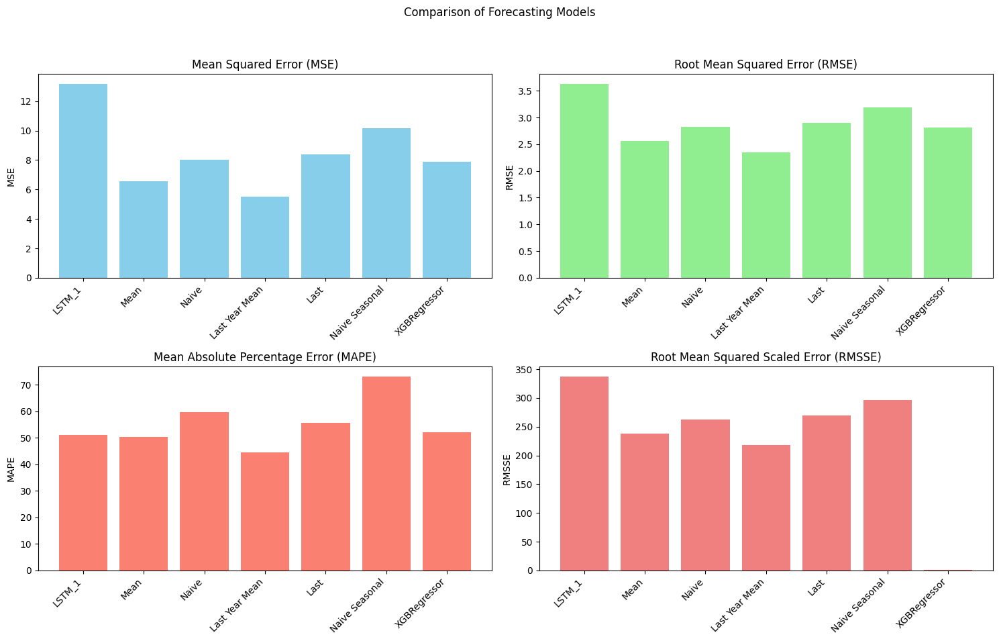

In [70]:
import matplotlib.pyplot as plt
import numpy as np

# Данные для каждой модели
models = ['LSTM_1', 'Mean', 'Naive', 'Last Year Mean', 'Last', 'Naive Seasonal', 'XGBRegressor']
mse_values = [
    13.18323103593684, # LSTM_1
    6.5702842270890525, # Mean
    8.004191069671554, # Naive
    5.500139706914857, # Last Year Mean
    8.372670196317294, # Last
    10.179233238064002, # Naive Seasonal
    7.904964809305931 # XGBRegressor
]
rmse_values = [
    3.630871938796085, # LSTM_1
    2.5632565667699074, # Mean
    2.8291679111837027, # Naive
    2.3452376653368967, # Last Year Mean
    2.893556668931385, # Last
    3.1904910653477785, # Naive Seasonal
    2.811576925731525 # XGBRegressor
]
mape_values = [
    51.03423091270405, # LSTM_1
    50.354109945645874, # Mean
    59.60988750012564, # Naive
    44.51988147012098, # Last Year Mean
    55.630433025100466, # Last
    73.19315770094354, # Naive Seasonal
    52.23193804481713 # XGBRegressor
]
rmsse_values = [
    337.4562678968326, # LSTM_1
    238.23114187408007, # Mean
    262.94515764535294, # Naive
    217.96828855231158, # Last Year Mean
    268.9295009533714, # Last
    296.5268243103189, # Naive Seasonal
    1.0072279077847452 # XGBRegressor
]


fig, axs = plt.subplots(2, 2, figsize=(15, 10))
fig.suptitle('Comparison of Forecasting Models')

# MSE
axs[0, 0].bar(models, mse_values, color='skyblue')
axs[0, 0].set_title('Mean Squared Error (MSE)')
axs[0, 0].set_ylabel('MSE')

# RMSE
axs[0, 1].bar(models, rmse_values, color='lightgreen')
axs[0, 1].set_title('Root Mean Squared Error (RMSE)')
axs[0, 1].set_ylabel('RMSE')

# MAPE
axs[1, 0].bar(models, mape_values, color='salmon')
axs[1, 0].set_title('Mean Absolute Percentage Error (MAPE)')
axs[1, 0].set_ylabel('MAPE')

# RMSSE
axs[1, 1].bar(models, rmsse_values, color='lightcoral')
axs[1, 1].set_title('Root Mean Squared Scaled Error (RMSSE)')
axs[1, 1].set_ylabel('RMSSE')


for ax in axs.flat:
    ax.set_xticklabels(models, rotation=45, ha='right')

plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()


Comparative analysis of each graph


Mean Squared Error (MSE):

The largest MSE error is for the LSTM_1 model (13.18).
The Last Year Mean model has the smallest error (~5.50).
Large MSE values ​​indicate a high degree of deviation of predictions from actual values. LSTM_1, Naive Seasonal and Last had the largest errors, meaning their predictions were less accurate compared to other models.


Root Mean Squared Error (RMSE):

The LSTM_1 model has the largest RMSE error (3.63).
The Last Year Mean model has the smallest error (~2.35).
RMSE shows the standard deviation of predictions from actual values. Last Year Mean and Mean models showed the best results, while LSTM_1 and Naive Seasonal showed the worst.

Mean Absolute Percentage Error (MAPE):

The Naive Seasonal model has the largest MAPE error (~73.19%).
The Last Year Mean model has the smallest error (44.52%).
MAPE shows the average absolute percentage error, which gives an idea of ​​the average relative deviation. Naive Seasonal has the highest errors, while Last Year Mean, Mean and LSTM_1 performed comparatively better.


Root Mean Square Scaled Error (RMSSE):

The highest RMSSE error is for the LSTM_1 model (~337.46).
The smallest error is in the XGBRegressor model (1.007).
RMSSE takes into account changes in training data. The XGBRegressor model showed the best result, while the LSTM_1 and Naive Seasonal models showed the largest errors.





#Why do you think the competition uses a Weighted Root Mean Squared Scaled Error?

I will calculate Weighted Root Mean Squared Scaled Error for each model

In [71]:
train_df

,0,1,2,3,4,5,6,7,8,9,...,30480,30481,30482,30483,30484,30485,30486,30487,30488,30489
d_1,0,0,0,0,0,0,0,12,2,0,...,0,14,1,0,4,0,0,0,0,0
d_2,0,0,0,0,0,0,0,15,0,0,...,0,11,1,0,4,0,0,6,0,0
d_3,0,0,0,0,0,0,0,0,7,1,...,0,5,1,0,2,2,0,0,0,0
d_4,0,0,0,0,0,0,0,0,3,0,...,0,6,1,0,5,2,0,2,0,0
d_5,0,0,0,0,0,0,0,0,0,0,...,0,5,1,0,2,0,0,2,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
d_1909,1,1,1,0,1,0,1,4,0,0,...,4,1,1,0,0,0,0,1,1,0
d_1910,3,0,0,1,2,0,0,6,0,0,...,2,3,3,0,2,1,0,0,0,0
d_1911,0,0,1,3,2,2,0,3,0,2,...,0,1,6,0,3,0,0,0,3,0
d_1912,1,0,1,7,2,0,1,2,0,0,...,3,0,0,4,2,0,1,1,1,0


In [72]:
total_sales_per_series = train_df.sum(axis=1)
total_sales_all_series = total_sales_per_series.sum()
weights = total_sales_per_series / total_sales_all_series

In [76]:
import numpy as np
from sklearn.metrics import mean_squared_error

def calculate_wrmsse(rmsse_values, weights):
    wrmsse = np.sqrt(np.sum(weights * np.array(rmsse_values)**2))
    return wrmsse

In [79]:
wrmsse_values_XGBRegressor=calculate_wrmsse(rmsse_values[6],weights)

In [78]:
wrmsse_values_XGBRegressor

1.0072279077847455

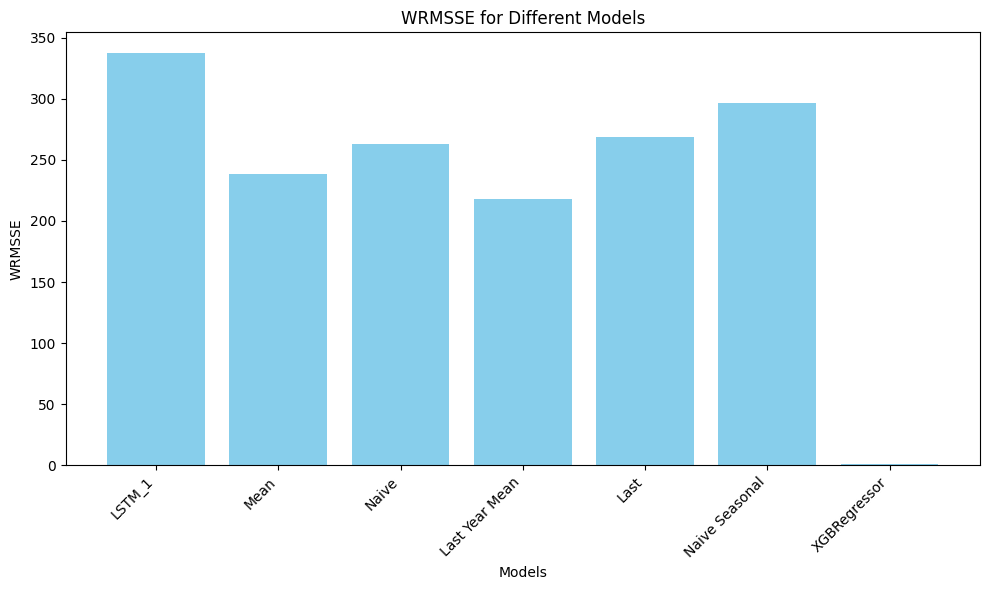

In [81]:
def calculate_wrmsse(rmsse_values, weights):
    rmsse_values = np.array(rmsse_values)
    wrmsse = np.sqrt(np.sum(weights * rmsse_values**2))
    return wrmsse


wrmsse_values = [calculate_wrmsse([rmsse], weights) for rmsse in rmsse_values]


model_names = [
    'LSTM_1',
    'Mean',
    'Naive',
    'Last Year Mean',
    'Last',
    'Naive Seasonal',
    'XGBRegressor'
]


plt.figure(figsize=(10, 6))
plt.bar(model_names, wrmsse_values, color='skyblue')
plt.xlabel('Models')
plt.ylabel('WRMSSE')
plt.title('WRMSSE for Different Models')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()


plt.show()

#For the WRMSSE error metric, the XGBRegressor models performed better than all trained models!

WRMSSE is used here to evaluate the solution to a time series forecasting problem, especially in cases where there is a need to predict multiple time series with different levels of importance (i.e. sales). In this problem, for 30,490 products, their sales are forecast for the next 28 days, so it is important to take into account the different sales and popularity of each product (after all, as was found out earlier, for example, FOODS has the greatest demand and, accordingly, products from this category will be sold more often than products from other categories), making WRMSSE a suitable metric.